In [1]:
%matplotlib inline

# Import custom scripts

In [2]:
path_scripts = '/Users/simjoo/Projects/10X_Skin/scripts/'

In [3]:
import sys
sys.path.append(path_scripts)

In [4]:
from Skin10X_misc_scripts_v1_4 import *
from Skin10X_plot_v1_0 import *
from Skin10X_affinity_propagation_v1_4 import *
from Skin10X_mann_whitney_u_v1_3 import *
from Skin10X_pseudotemporal_ordering_v1_3 import *

/Users/simjoo/anaconda/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
/Users/simjoo/.local/lib/python3.6/site-packages/scanpy/api/__init__.py:6: FutureWarning: 

In a future version of Scanpy, `scanpy.api` will be removed.
Simply use `import scanpy as sc` and `import scanpy.external as sce` instead.

  FutureWarning


In [5]:
import csv
import os
import scipy.io
import pickle
import scanpy.api as sc

In [6]:
#exp_id = create_ID()

In [7]:
exp_id = '201806201840'
path_input = '/Users/simjoo/Projects/10X_Skin/data_input/v1.5'
path_output = '/Users/simjoo/Projects/10X_Skin/data_output/v1.5'
path_figures = '/Users/simjoo/Projects/10X_Skin/figures/v1.5'

# Initialize engines

In [8]:
from ipyparallel import Client

In [9]:
c = Client()

In [10]:
dview = c[:]

In [11]:
dview.execute('import sys')
dview.execute('sys.path.append("/Users/simjoo/Projects/10X_Skin/scripts/")')
dview.execute('from Skin10X_affinity_propagation_v1_4 import *')
dview.execute('Skin10X_mann_whitney_u_v1_4 import *')

<AsyncResult: execute>

# Import and compile data

In [13]:
dir_5w = '/Users/simjoo/Projects/10X_Skin/data_input/v1.5/raw_5w/'
dir_9w = '/Users/simjoo/Projects/10X_Skin/data_input/v1.5/raw_9w/'

In [14]:
mat_5w = scipy.io.mmread(os.path.join(dir_5w, "matrix.mtx"))
mat_9w = scipy.io.mmread(os.path.join(dir_9w, "matrix.mtx"))

In [15]:
gene_ids_5w = [row[0] for row in csv.reader(open(os.path.join(dir_5w, "genes.tsv")), delimiter="\t")]
gene_ids_9w = [row[0] for row in csv.reader(open(os.path.join(dir_9w, "genes.tsv")), delimiter="\t")]

In [16]:
gene_names_5w = [row[1] for row in csv.reader(open(os.path.join(dir_5w, "genes.tsv")), delimiter="\t")]
gene_names_9w = [row[1] for row in csv.reader(open(os.path.join(dir_9w, "genes.tsv")), delimiter="\t")]

In [17]:
barcodes_5w = ['%s-5w' % row[0][:-2] for row in csv.reader(open(os.path.join(dir_5w, "barcodes.tsv")), delimiter="\t")]
barcodes_9w = ['%s-9w' % row[0][:-2] for row in csv.reader(open(os.path.join(dir_9w, "barcodes.tsv")), delimiter="\t")]

In [18]:
seq_5w = pd.DataFrame(mat_5w.toarray(), index = gene_names_5w, columns = barcodes_5w)
seq_9w = pd.DataFrame(mat_9w.toarray(), index = gene_names_9w, columns = barcodes_9w)

In [19]:
seq = pd.concat([seq_5w, seq_9w], axis = 1)

In [20]:
print(len(seq.index))

27998


In [21]:
print(len(seq.columns))

6335


In [22]:
seq = fuse_genes_v1(seq)

In [23]:
print(len(seq.index))

27933


## Subsequent analysis revealed that replicate 9wk3 might - in addition to being low yield - have problems with cross-contamination due to e.g. dysfunctional droplet generation. We therefore decided to exclude data from this replicate.

In [23]:
bc = loadData_v1(path_input, exp_id, 'assigned_barcodes', 'Series')
cells_replicate = pd.Series(index = seq.columns)
for ix in cells_replicate.index:
    if type(bc['%s-1' % ix[:-3]]) != str:
        cells_replicate[ix] = '%s unassigned' % ix.split('-')[-1]
    elif bc['%s-1' % ix[:-3]] == 'unassigned':
        cells_replicate[ix] = '%s unassigned' % ix.split('-')[-1]
    else:
        cells_replicate[ix] = bc['%s-1' % ix[:-3]]

In [24]:
Counter(cells_replicate)

Counter({'5wk3': 663,
         '5wk1': 1488,
         '5wk2': 1156,
         '5w unassigned': 24,
         '9wk2': 1392,
         '9wk3': 235,
         '9wk1': 1181,
         '9w unassigned': 196})

In [26]:
c_sel = cells_replicate[cells_replicate!='9wk3'].index

In [27]:
len(c_sel)

6100

In [28]:
seq = seq[c_sel]

### Checkpoint

In [29]:
#saveData_v1(seq, path_output, exp_id, 'seq')

In [12]:
seq = loadData_v1(path_output, exp_id, 'seq', 'DataFrame')

In [13]:
cells_stage = pd.Series([c[-2:] for c in seq.columns], index = seq.columns)

# Analysis of anagen differentiation with RNA velocity

In [25]:
import velocyto as vcy
print(vcy.__version__)

0.17.8


In [26]:
path_input_vcy = '/Users/simjoo/Projects/10X_Skin/velocyto/data_input/v1.5/'
path_output_vcy = '/Users/simjoo/Projects/10X_Skin/velocyto/data_output/v1.5/'

## RNA velocity model 0: all anagen populations

In [945]:
vlm_ana0 = vcy.VelocytoLoom('%s/%s' % (path_input_vcy, '5wk_EZQA6.loom'))

### Filter cells (all anagen cells)

In [946]:
c_sel = cl_c_ANA.index

In [947]:
cells_bool = []

for c in vlm_ana0.ca['CellID']:
    if '%s-%s' % (c.split(':')[1][:-1], c.split(':')[0][:2]) in c_sel: cells_bool += [True]
    else: cells_bool += [False]

In [948]:
vlm_ana0.filter_cells(np.array(cells_bool))

### Add clustering data

In [949]:
cells_cl = [cl_c_ANA['%s-%s' % (c.split(':')[1][:-1], c.split(':')[0][:2])] for c in vlm_ana0.ca['CellID']]

In [950]:
vlm_ana0.set_clusters(cluster_labels=cells_cl,cluster_colors_dict=cmap_2nd)

### Filter data by overall expression

In [951]:
len(vlm_ana0.ra['Gene'])

28692

In [952]:
vlm_ana0.score_detection_levels(min_expr_counts = 10, min_expr_counts_U = 1, min_cells_express_U = 1)

In [953]:
np.sum(vlm_ana0.detection_level_selected)

8592

In [954]:
vlm_ana0.filter_genes(by_detection_levels=True)

### Normalize data

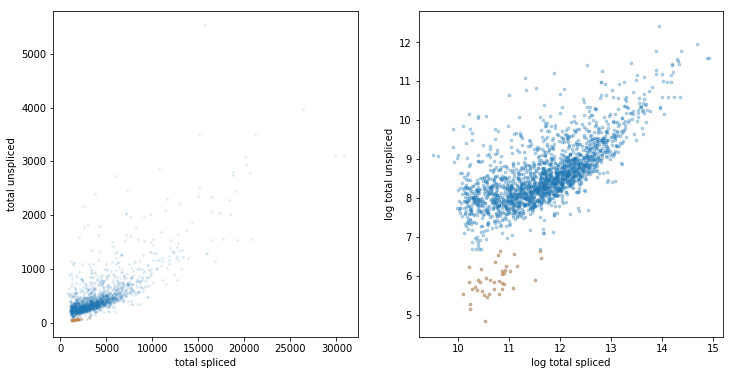

In [955]:
vlm_ana0.normalize_by_total(min_perc_U = 2, plot = True)

In [956]:
vlm_ana0.adjust_totS_totU(skip_low_U_pop = False, fit_with_low_U = False)

### Perform PCA

In [957]:
vlm_ana0.perform_PCA(which = 'S_norm', n_components = 15)

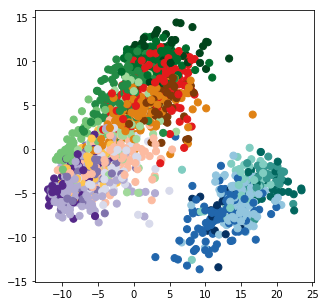

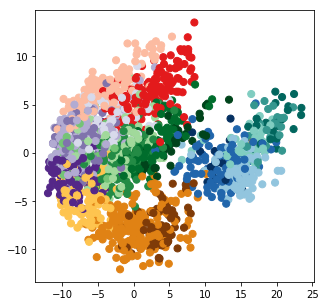

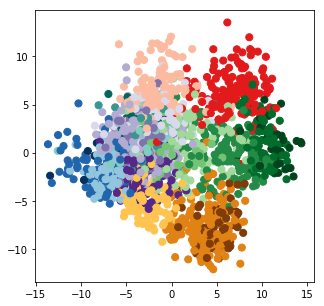

In [958]:
velocyto_plot_pca_2d(vlm_ana0, comps = [0,1])
velocyto_plot_pca_2d(vlm_ana0, comps = [0,2])
velocyto_plot_pca_2d(vlm_ana0, comps = [1,2])

### Perform knn imputation

In [959]:
vlm_ana0.knn_imputation(k = 100, pca_space = True, metric = 'euclidean', size_norm = True, balanced = True)

### Fit gammas

In [960]:
vlm_ana0.fit_gammas(steady_state_bool = None, 
                   use_imputed_data = True, 
                   use_size_norm = False, 
                   fit_offset = True, 
                   fixperc_q = False, 
                   weighted = True, 
                   weights = 'maxmin_diag', 
                   limit_gamma = False)

### Filter genes based on R2 and gamma

In [961]:
vlm_ana0.filter_genes_by_phase_portrait(minR2 = 0.2, min_gamma = 0.01)

In [962]:
len(vlm_ana0.ra['Gene'])

905

### Predict U, calculate velocity and extrapolate

In [963]:
vlm_ana0.predict_U(which_S='Sx')
vlm_ana0.calculate_velocity()
vlm_ana0.calculate_shift(assumption="constant_velocity")
vlm_ana0.extrapolate_cell_at_t(delta_t=1)

### Set UMAP

In [964]:
c_sel = []
c_bool = []

for c in vlm_ana0.ca['CellID']:
    if '%s-%s' % (c.split(':')[1][:-1], c.split(':')[0][:2]) in cl_c_ANA.index:
        c_sel += ['%s-%s' % (c.split(':')[1][:-1], c.split(':')[0][:2])]
        c_bool += [True]
    else:
        c_bool += [False]

In [965]:
vlm_ana0.ts = np.array(umap_ANA.loc[c_sel])

### Calculate transition probability and embedding shift

In [966]:
vlm_ana0.estimate_transition_prob(hidim="Sx", embed="ts", transform = "log", knn_random = False, n_sight = 500)
vlm_ana0.calculate_embedding_shift(sigma_corr = 0.1, expression_scaling=True)

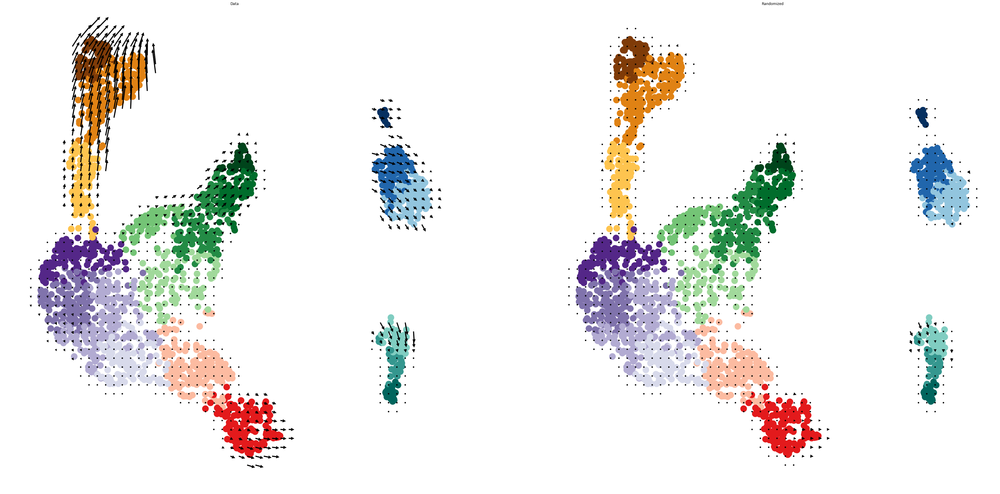

In [967]:
height = 30
width = 30 * 2

fig = plt.figure(facecolor = 'w', figsize = (width, height))

vlm_ana0.calculate_grid_arrows(smooth=1.0, steps=(50, 50), n_neighbors=500)
vlm_ana0.plot_grid_arrows(scatter_kwargs_dict={"alpha":1, "lw":0.0, "edgecolor":"0", "s":500, "rasterized":True}, 
                     min_mass=1, angles='xy', scale_units='xy', plot_random = True,
                     headaxislength=3, headlength=3, headwidth=3, quiver_scale=0.75)

### Checkpoint

In [968]:
vlm_ana0.cluster_labels = [c.encode('utf8') for c in vlm_ana0.cluster_labels]
vlm_ana0.colorandum = [c.encode('utf8') for c in vlm_ana0.colorandum]

In [969]:
vlm_ana0.to_hdf5(path_output_vcy + exp_id + '_vlm_ana0.hdf5')

In [970]:
vlm_ana0 = vcy.load_velocyto_hdf5(path_output_vcy + exp_id + '_vlm_ana0.hdf5')

## RNA velocity model 1: ORS populations - individual genes

In [499]:
vlm_ana1 = vcy.VelocytoLoom('%s/%s' % (path_input_vcy, '5wk_EZQA6.loom'))

### Filter cells

In [500]:
c_sel = cl_c_ANA[cl_c_ANA.isin(['ANA - 0','ANA - 1', 'ANA - 2', 'ANA - 3','ANA - 20','ANA - 21'])].index

In [501]:
len(c_sel)

335

In [502]:
cells_bool = []

for c in vlm_ana1.ca['CellID']:
    if '%s-%s' % (c.split(':')[1][:-1], c.split(':')[0][:2]) in c_sel: cells_bool += [True]
    else: cells_bool += [False]

In [503]:
vlm_ana1.filter_cells(np.array(cells_bool))

### Add clustering data

In [504]:
cells_cl = [cl_c_ANA['%s-%s' % (c.split(':')[1][:-1], c.split(':')[0][:2])] for c in vlm_ana1.ca['CellID']]

In [505]:
vlm_ana1.set_clusters(cluster_labels=cells_cl,cluster_colors_dict=cmap_2nd)

### Filter data by overall expression

In [506]:
len(vlm_ana1.ra['Gene'])

28692

In [507]:
vlm_ana1.score_detection_levels(min_expr_counts = 10, min_expr_counts_U = 1, min_cells_express_U = 1)

In [508]:
np.sum(vlm_ana1.detection_level_selected)

3379

### Normalize data

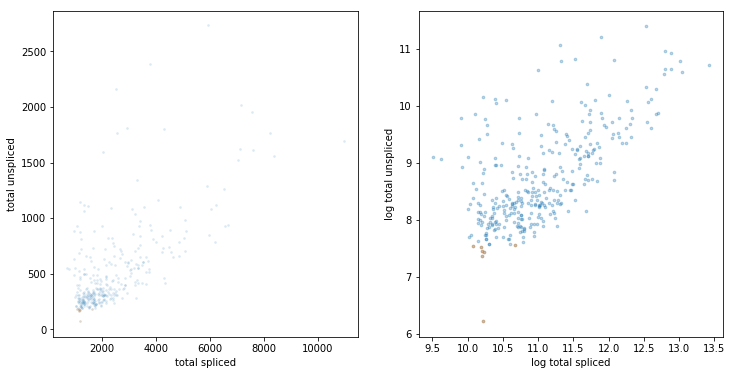

In [509]:
vlm_ana1.normalize_by_total(min_perc_U = 2, plot = True)

In [510]:
vlm_ana1.adjust_totS_totU(skip_low_U_pop = False, fit_with_low_U = False)

### Perform PCA

In [511]:
vlm_ana1.perform_PCA(which = 'S_norm', n_components = 5)

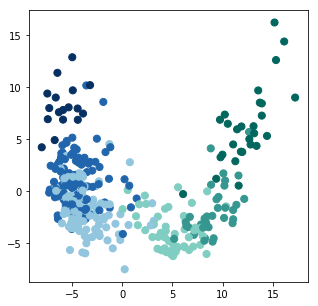

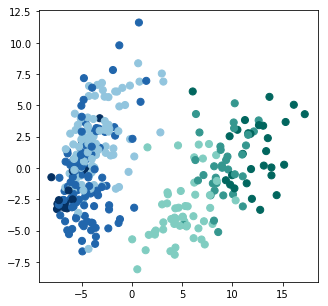

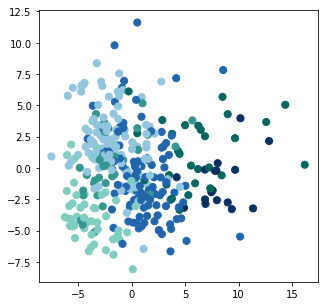

In [512]:
velocyto_plot_pca_2d(vlm_ana1, comps = [0,1])
velocyto_plot_pca_2d(vlm_ana1, comps = [0,2])
velocyto_plot_pca_2d(vlm_ana1, comps = [1,2])

### Perform knn imputation

In [513]:
vlm_ana1.knn_imputation(k = 25, pca_space = True, metric = 'euclidean', size_norm = True, balanced = True)

### Fit gammas

In [514]:
vlm_ana1.fit_gammas(steady_state_bool = None, 
                   use_imputed_data = True, 
                   use_size_norm = False, 
                   fit_offset = True, 
                   fixperc_q = False, 
                   weighted = True, 
                   weights = 'maxmin_diag', 
                   limit_gamma = False)

### Checkpoint

In [515]:
vlm_ana1.cluster_labels = [c.encode('utf8') for c in vlm_ana1.cluster_labels]
vlm_ana1.colorandum = [c.encode('utf8') for c in vlm_ana1.colorandum]

In [517]:
vlm_ana1.to_hdf5(path_output_vcy + exp_id + '_vlm_ana1_interm.hdf5')

### Filter genes based on R2 and gamma

In [518]:
vlm_ana1.filter_genes_by_phase_portrait(minR2 = 0.2, min_gamma = 0.01)

/Users/simjoo/anaconda/pkgs/velocyto.py/velocyto/analysis.py:1288: RuntimeWarning: divide by zero encountered in true_divide
  return (A_m * B_m).sum(1) / (np.linalg.norm(A_m, 2, 1) * np.linalg.norm(B_m, 2, 1))
/Users/simjoo/anaconda/pkgs/velocyto.py/velocyto/analysis.py:1288: RuntimeWarning: invalid value encountered in true_divide
  return (A_m * B_m).sum(1) / (np.linalg.norm(A_m, 2, 1) * np.linalg.norm(B_m, 2, 1))
/Users/simjoo/anaconda/pkgs/velocyto.py/velocyto/analysis.py:1308: RuntimeWarning: invalid value encountered in greater
  tmp_filter = tmp_filter & (Corr > minCorr)


In [519]:
len(vlm_ana1.ra['Gene'])

359

### Predict U, calculate velocity and extrapolate

In [520]:
vlm_ana1.predict_U(which_S='Sx')
vlm_ana1.calculate_velocity()
vlm_ana1.calculate_shift(assumption="constant_velocity")
vlm_ana1.extrapolate_cell_at_t(delta_t=1)

### Set UMAP

In [521]:
c_sel = ['%s-%s' % (c.split(':')[1][:-1], c.split(':')[0][:2]) for c in vlm_ana1.ca['CellID']]

In [522]:
vlm_ana1.ts = np.array(umap_ANA.loc[c_sel])

### Calculate transition probability and embedding shift

In [523]:
vlm_ana1.colorandum = [cmap_2nd[cl_c_ANA['%s-%s' % (c.split(':')[1][:-1], c.split(':')[0][:2])]] for c in vlm_ana1.ca['CellID']]

In [524]:
vlm_ana1.estimate_transition_prob(hidim="Sx", embed="ts", transform = "log", knn_random = False, n_sight = 100)
vlm_ana1.calculate_embedding_shift(sigma_corr = 0.1, expression_scaling=True)

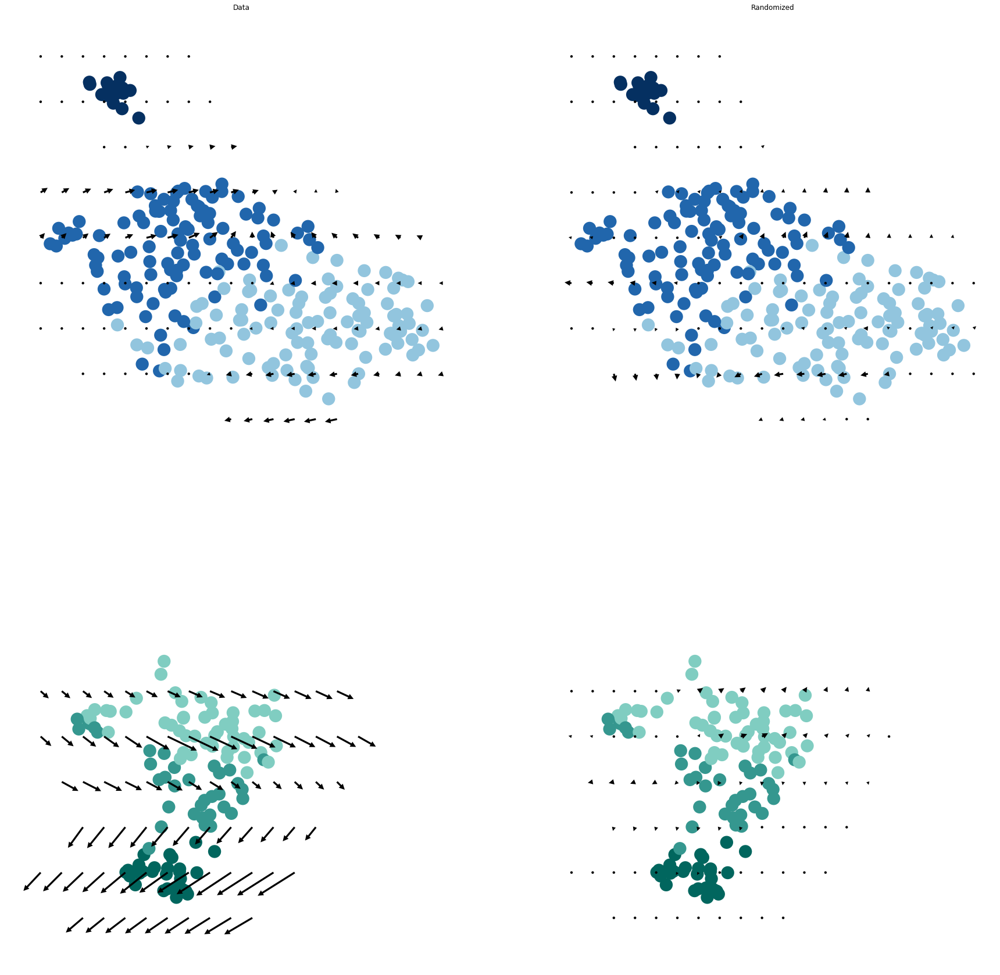

In [525]:
height = 30
width = 15 * 2

fig = plt.figure(facecolor = 'w', figsize = (width, height))

vlm_ana1.calculate_grid_arrows(smooth=1.0, steps=(20, 20), n_neighbors=25)
vlm_ana1.plot_grid_arrows(scatter_kwargs_dict={"alpha":1, "lw":0.0, "edgecolor":"0", "s":500, "rasterized":True}, 
                     min_mass=1, angles='xy', scale_units='xy', plot_random = True,
                     headaxislength=3, headlength=3, headwidth=3, quiver_scale=0.5)

### Checkpoint

In [528]:
vlm_ana1.to_hdf5(path_output_vcy + exp_id + '_vlm_ana1.hdf5')

In [529]:
vlm_ana1 = vcy.load_velocyto_hdf5(path_output_vcy + exp_id + '_vlm_ana1.hdf5')

## RNA velocity model 2: matrix populations

In [530]:
vlm_ana2 = vcy.VelocytoLoom('%s/%s' % (path_input_vcy, '5wk_EZQA6.loom'))

### Filter cells

In [531]:
c_sel = cl_c_ANA[~cl_c_ANA.isin(['ANA - 0','ANA - 1', 'ANA - 2', 'ANA - 3','ANA - 20','ANA - 21'])].index

In [532]:
len(c_sel)

1639

In [533]:
cells_bool = []

for c in vlm_ana2.ca['CellID']:
    if '%s-%s' % (c.split(':')[1][:-1], c.split(':')[0][:2]) in c_sel: cells_bool += [True]
    else: cells_bool += [False]

In [534]:
vlm_ana2.filter_cells(np.array(cells_bool))

### Add clustering data

In [535]:
cells_cl = [cl_c_ANA['%s-%s' % (c.split(':')[1][:-1], c.split(':')[0][:2])] for c in vlm_ana2.ca['CellID']]

In [536]:
vlm_ana2.set_clusters(cluster_labels=cells_cl,cluster_colors_dict=cmap_2nd)

In [537]:
len(vlm_ana2.ra['Gene'])

28692

### Filter data by overall expression

In [538]:
vlm_ana2.score_detection_levels(min_expr_counts = 10, min_expr_counts_U = 1, min_cells_express_U = 1)

In [539]:
np.sum(vlm_ana2.detection_level_selected)

8132

In [540]:
vlm_ana2.filter_genes(by_detection_levels=True)

### Normalize data

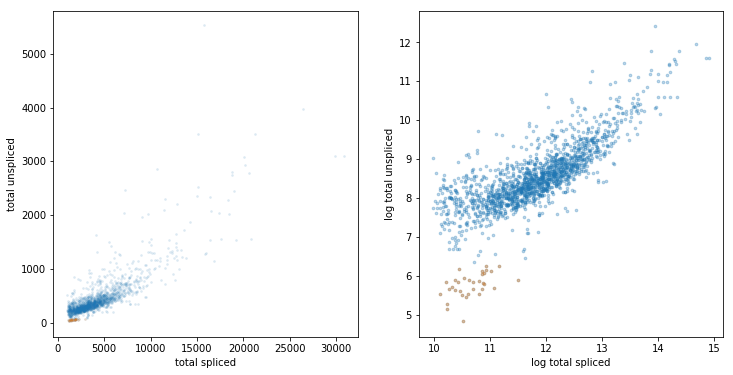

In [541]:
vlm_ana2.normalize_by_total(min_perc_U = 2, plot = True)

In [542]:
vlm_ana2.adjust_totS_totU(skip_low_U_pop = False, fit_with_low_U = False)

## Perform PCA

In [543]:
vlm_ana2.perform_PCA(which = 'S_norm', n_components = 15)

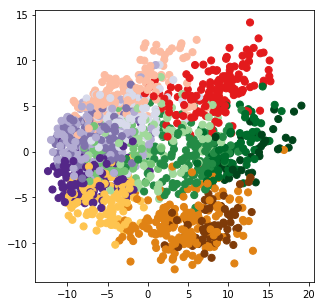

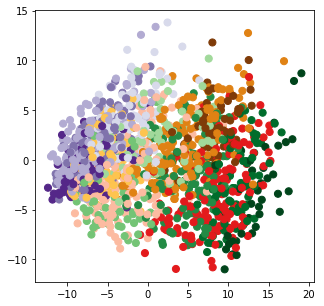

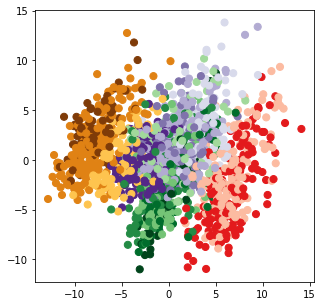

In [544]:
velocyto_plot_pca_2d(vlm_ana2, comps = [0,1])
velocyto_plot_pca_2d(vlm_ana2, comps = [0,2])
velocyto_plot_pca_2d(vlm_ana2, comps = [1,2])

### Perform knn imputation

In [545]:
vlm_ana2.knn_imputation(k = 100, pca_space = True, metric = 'euclidean', size_norm = True, balanced = True)

### Fit gammas

In [546]:
vlm_ana2.fit_gammas(steady_state_bool = None, 
                   use_imputed_data = True, 
                   use_size_norm = False, 
                   fit_offset = True, 
                   fixperc_q = False, 
                   weighted = True, 
                   weights = 'maxmin_diag', 
                   limit_gamma = False)

### Checkpoint

In [548]:
vlm_ana2.cluster_labels = [c.encode('utf8') for c in vlm_ana2.cluster_labels]
vlm_ana2.colorandum = [c.encode('utf8') for c in vlm_ana2.colorandum]

In [549]:
#vlm_ana2.to_hdf5(path_output_vcy + exp_id + '_vlm_ana2_interm.hdf5')

### Filter genes based on R2 and gamma

In [550]:
vlm_ana2.filter_genes_by_phase_portrait(minR2 = 0.2, min_gamma = 0.01)

In [551]:
len(vlm_ana2.ra['Gene'])

598

### Predict U, calculate velocity and extrapolate

In [552]:
vlm_ana2.predict_U(which_S='Sx')
vlm_ana2.calculate_velocity()
vlm_ana2.calculate_shift(assumption="constant_velocity")
vlm_ana2.extrapolate_cell_at_t(delta_t=1)

### Set UMAP

In [553]:
c_sel = ['%s-%s' % (c.split(':')[1][:-1], c.split(':')[0][:2]) for c in vlm_ana2.ca['CellID']]

In [554]:
vlm_ana2.ts = np.array(umap_ANA.loc[c_sel])

### Calculate transition probability and embedding shift

In [555]:
vlm_ana2.colorandum = [cmap_2nd[cl_c_ANA['%s-%s' % (c.split(':')[1][:-1], c.split(':')[0][:2])]] for c in vlm_ana2.ca['CellID']]

In [556]:
vlm_ana2.estimate_transition_prob(hidim="Sx", embed="ts", transform = "log", knn_random = False, n_sight = 500)
vlm_ana2.calculate_embedding_shift(sigma_corr = 0.1, expression_scaling=True)

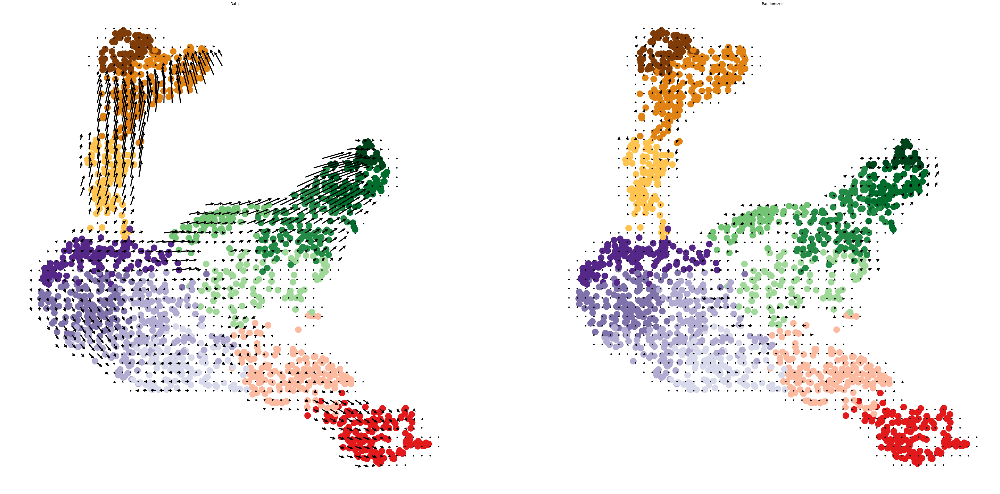

In [557]:
height = 30
width = 30 * 2

fig = plt.figure(facecolor = 'w', figsize = (width, height))

vlm_ana2.calculate_grid_arrows(smooth=1.0, steps=(50, 50), n_neighbors=100)
vlm_ana2.plot_grid_arrows(scatter_kwargs_dict={"alpha":1, "lw":0.0, "edgecolor":"0", "s":500, "rasterized":True}, 
                     min_mass=1, angles='xy', scale_units='xy', plot_random = True,
                     headaxislength=3, headlength=3, headwidth=3, quiver_scale=0.5)

### Checkpoint

In [558]:
vlm_ana2.to_hdf5(path_output_vcy + exp_id + '_vlm_ana2.hdf5')

In [27]:
vlm_ana2 = vcy.load_velocyto_hdf5(path_output_vcy + exp_id + '_vlm_ana2.hdf5')

### Markov model

In [28]:
# Sample uniformly the points to avoid density driven effects - Should reimplement as a method
steps = 50, 50
grs = []
for dim_i in range(vlm_ana2.embedding.shape[1]):
    m, M = np.min(vlm_ana2.embedding[:, dim_i]), np.max(vlm_ana2.embedding[:, dim_i])
    m = m - 0.025 * np.abs(M - m)
    M = M + 0.025 * np.abs(M - m)
    gr = np.linspace(m, M, steps[dim_i])
    grs.append(gr)

meshes_tuple = np.meshgrid(*grs)
gridpoints_coordinates = np.vstack([i.flat for i in meshes_tuple]).T

from sklearn.neighbors import NearestNeighbors
nn = NearestNeighbors()
nn.fit(vlm_ana2.embedding)
dist, ixs = nn.kneighbors(gridpoints_coordinates, 1)

diag_step_dist = np.sqrt((meshes_tuple[0][0,0] - meshes_tuple[0][0,1])**2 + (meshes_tuple[1][0,0] - meshes_tuple[1][1,0])**2)
min_dist = diag_step_dist / 2
ixs = ixs[dist < min_dist]
gridpoints_coordinates = gridpoints_coordinates[dist.flat[:]<min_dist,:]
dist = dist[dist < min_dist]

ixs = np.unique(ixs)

### Run Markov - forward

In [29]:
vlm_ana2.prepare_markov(sigma_D=diag_step_dist, sigma_W=diag_step_dist/2, direction='forward', cells_ixs=ixs)

In [30]:
vlm_ana2.run_markov(starting_p=np.ones(len(ixs)), n_steps=2500)

In [31]:
c_sel = ['%s-%s' % (c.split(':')[1][:-1], c.split(':')[0][:2]) for c in vlm_ana2.ca['CellID'][ixs]]
diffused_fwd = pd.Series(vlm_ana2.diffused, index = c_sel)

/Users/simjoo/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:48: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated


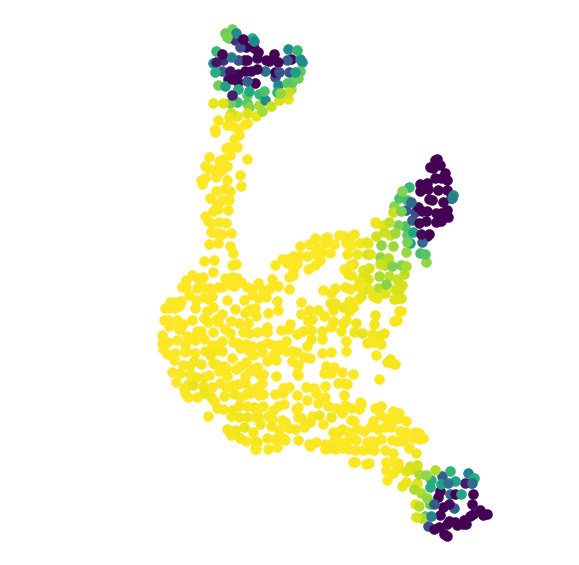

In [36]:
data = diffused_fwd.copy()
data -= np.percentile(data, 10)
data /= np.percentile(data, 90)
data = np.clip(data, 0, 1)

tsne = umap_ANA.ix[data.index]
cmap = plt.cm.viridis_r
time = cells_stage
vmin = 0.0
vmax = 1.0

#initialize figure

height = 10
width = 10

fig = plt.figure(facecolor = 'w', figsize = (width, height))

#define x- and y-limits

x_min, x_max = np.min(tsne['x']), np.max(tsne['x'])
y_min, y_max = np.min(tsne['y']), np.max(tsne['y'])
x_diff, y_diff = x_max - x_min, y_max - y_min

pad = 2.0

if x_diff > y_diff:
    xlim = (x_min - pad, x_max + pad)
    ylim = (y_min * (x_diff / y_diff) - pad, y_max * (x_diff / y_diff) + pad)

if x_diff < y_diff:
    xlim = (x_min * (y_diff/x_diff) - pad, x_max * (y_diff/x_diff) + pad)
    ylim = (y_min - pad, y_max + pad)

text_pad = 2

#draw groups

ax1 = plt.subplot()

ax1.set_xlim(xlim[0], xlim[1])
ax1.set_ylim(ylim[0], ylim[1])

remove_ticks(ax1)

for ix in tsne.index:

    ax1.scatter(tsne.ix[ix,'x'],
                tsne.ix[ix,'y'], 
                s = 100,
                linewidth = 0.5,
                c = cmap((data[ix] - vmin) / (vmax - vmin)),
                edgecolor=cmap((data[ix] - vmin) / (vmax - vmin)))

clean_axis(ax1)

### Run Markov - backwards

In [37]:
vlm_ana2.prepare_markov(sigma_D=diag_step_dist, sigma_W=diag_step_dist/2., direction = "backwards", cells_ixs=ixs)

In [38]:
vlm_ana2.run_markov(starting_p=np.ones(len(ixs)), n_steps=2500)

In [39]:
c_sel = ['%s-%s' % (c.split(':')[1][:-1], c.split(':')[0][:2]) for c in vlm_ana2.ca['CellID'][ixs]]
diffused_bwd = pd.Series(vlm_ana2.diffused, index = c_sel)

/Users/simjoo/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:48: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated


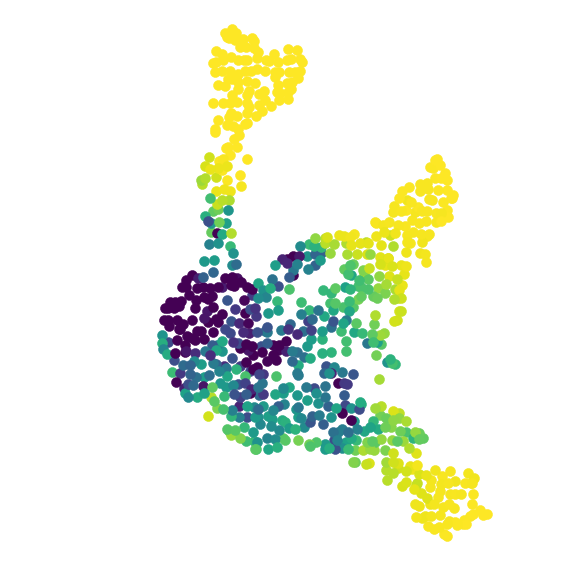

In [40]:
data = diffused_bwd.copy()
data -= np.percentile(data, 10)
data /= np.percentile(data, 90)
data = np.clip(data, 0, 1)

tsne = umap_ANA.ix[data.index]
cmap = plt.cm.viridis_r
time = cells_stage
vmin = 0.0
vmax = 1.0

#initialize figure

height = 10
width = 10

fig = plt.figure(facecolor = 'w', figsize = (width, height))

#define x- and y-limits

x_min, x_max = np.min(tsne['x']), np.max(tsne['x'])
y_min, y_max = np.min(tsne['y']), np.max(tsne['y'])
x_diff, y_diff = x_max - x_min, y_max - y_min

pad = 2.0

if x_diff > y_diff:
    xlim = (x_min - pad, x_max + pad)
    ylim = (y_min * (x_diff / y_diff) - pad, y_max * (x_diff / y_diff) + pad)

if x_diff < y_diff:
    xlim = (x_min * (y_diff/x_diff) - pad, x_max * (y_diff/x_diff) + pad)
    ylim = (y_min - pad, y_max + pad)

text_pad = 2

#draw groups

ax1 = plt.subplot()

ax1.set_xlim(xlim[0], xlim[1])
ax1.set_ylim(ylim[0], ylim[1])

remove_ticks(ax1)

for ix in tsne.index:

    ax1.scatter(tsne.ix[ix,'x'],
                tsne.ix[ix,'y'], 
                s = 100,
                linewidth = 0.5,
                c = cmap((data[ix] - vmin) / (vmax - vmin)),
                edgecolor=cmap((data[ix] - vmin) / (vmax - vmin)))

clean_axis(ax1)

### Checkpoint

In [43]:
saveData_v1(diffused_fwd, path_output, exp_id, 'diffused_fwd')
saveData_v1(diffused_bwd, path_output, exp_id, 'diffused_bwd')

In [570]:
vlm_ana2.to_hdf5(path_output_vcy + exp_id + '_vlm_ana2.hdf5')

## RNA velocity model 3: IRS populations (based on model 2)

In [571]:
vlm_ana3 = vcy.load_velocyto_hdf5(path_output_vcy + exp_id + '_vlm_ana2.hdf5')

### Set UMAP

In [572]:
c_sel = []
c_bool = []

for c in vlm_ana3.ca['CellID']:
    if '%s-%s' % (c.split(':')[1][:-1], c.split(':')[0][:2]) in umap_ANA_IRS.index:
        c_sel += ['%s-%s' % (c.split(':')[1][:-1], c.split(':')[0][:2])]
        c_bool += [True]
    else:
        c_bool += [False]

In [573]:
vlm_ana3.ts = np.array(umap_ANA_IRS.loc[c_sel])

In [574]:
vlm_ana3.ca['CellID'] = vlm_ana3.ca['CellID'][c_bool]
vlm_ana3.Sx = vlm_ana3.Sx[:,c_bool]
vlm_ana3.delta_S = vlm_ana3.delta_S[:,c_bool]

In [575]:
vlm_ana3.Sx = vlm_ana3.Sx.copy(order = 'C')
vlm_ana3.delta_S = vlm_ana3.delta_S.copy(order = 'C')

### Calculate transition probability and embedding shift

In [576]:
vlm_ana3.estimate_transition_prob(hidim="Sx", embed="ts", transform = "log", knn_random = False, n_sight = 50)
vlm_ana3.calculate_embedding_shift(sigma_corr = 0.1, expression_scaling=True)

In [577]:
vlm_ana3.colorandum = [cmap_2nd[cl_c_ANA_IRS['%s-%s' % (c.split(':')[1][:-1], c.split(':')[0][:2])]] for c in vlm_ana3.ca['CellID']]

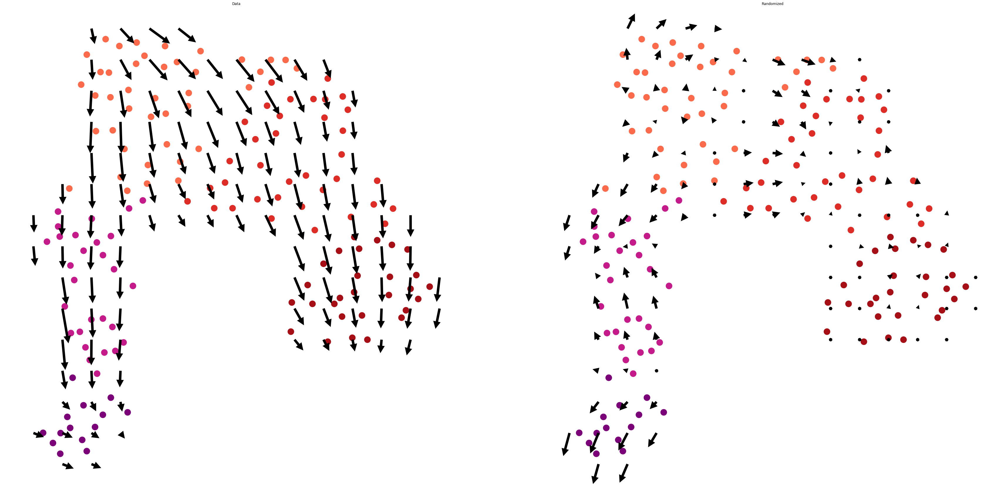

In [578]:
height = 30
width = 30 * 2

fig = plt.figure(facecolor = 'w', figsize = (width, height))

vlm_ana3.calculate_grid_arrows(smooth=1.0, steps=(15, 15), n_neighbors=50)
vlm_ana3.plot_grid_arrows(scatter_kwargs_dict={"alpha":1, "lw":0.0, "edgecolor":"0", "s":500, "rasterized":True}, 
                     min_mass=1, angles='xy', scale_units='xy', plot_random = True,
                     headaxislength=3, headlength=3, headwidth=3, quiver_scale=0.1)

### Markov model

In [579]:
# Sample uniformly the points to avoid density driven effects - Should reimplement as a method
steps = 15, 15
grs = []
for dim_i in range(vlm_ana3.embedding.shape[1]):
    m, M = np.min(vlm_ana3.embedding[:, dim_i]), np.max(vlm_ana3.embedding[:, dim_i])
    m = m - 0.025 * np.abs(M - m)
    M = M + 0.025 * np.abs(M - m)
    gr = np.linspace(m, M, steps[dim_i])
    grs.append(gr)

meshes_tuple = np.meshgrid(*grs)
gridpoints_coordinates = np.vstack([i.flat for i in meshes_tuple]).T

from sklearn.neighbors import NearestNeighbors
nn = NearestNeighbors()
nn.fit(vlm_ana3.embedding)
dist, ixs = nn.kneighbors(gridpoints_coordinates, 1)

diag_step_dist = np.sqrt((meshes_tuple[0][0,0] - meshes_tuple[0][0,1])**2 + (meshes_tuple[1][0,0] - meshes_tuple[1][1,0])**2)
min_dist = diag_step_dist / 2
ixs = ixs[dist < min_dist]
gridpoints_coordinates = gridpoints_coordinates[dist.flat[:]<min_dist,:]
dist = dist[dist < min_dist]

ixs = np.unique(ixs)

### Run Markov - forward

In [580]:
vlm_ana3.prepare_markov(sigma_D=diag_step_dist, sigma_W=diag_step_dist/2, direction='forward', cells_ixs=ixs)

In [581]:
vlm_ana3.run_markov(starting_p=np.ones(len(ixs)), n_steps=2500)

In [582]:
c_sel = ['%s-%s' % (c.split(':')[1][:-1], c.split(':')[0][:2]) for c in vlm_ana3.ca['CellID'][ixs]]
diffused_IRS_fwd = pd.Series(vlm_ana3.diffused, index = c_sel)

/Users/simjoo/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:48: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated


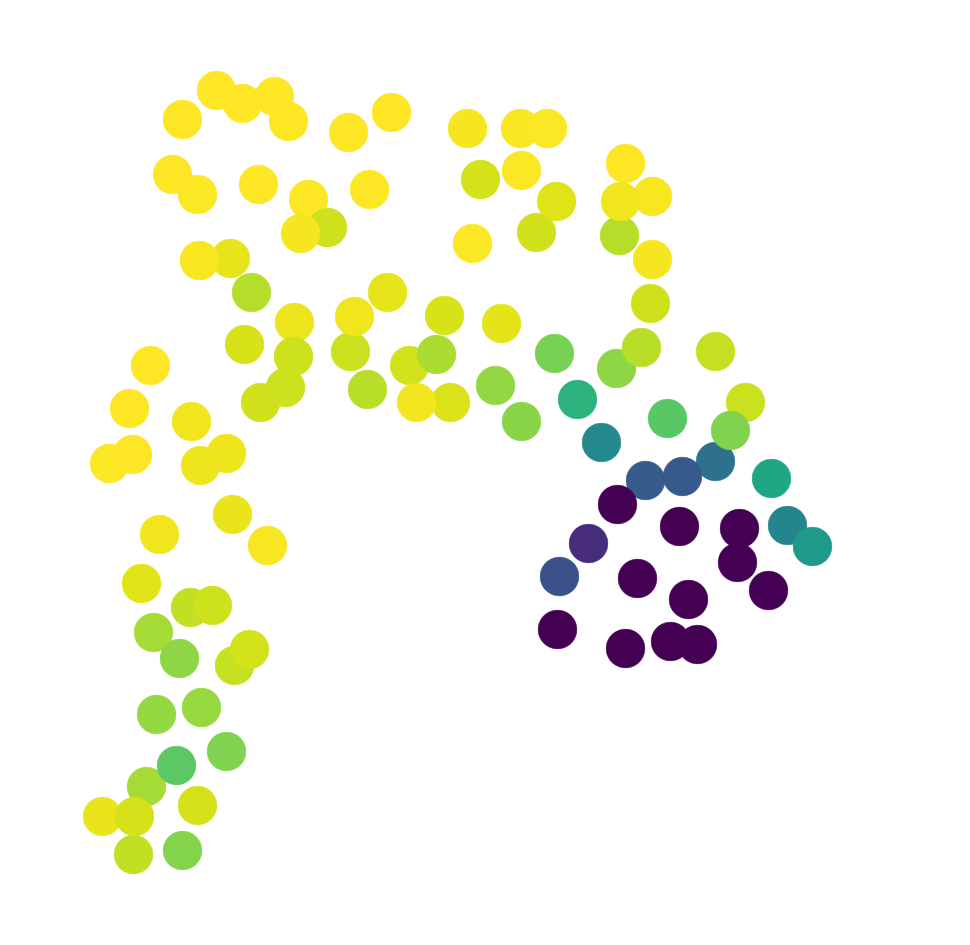

In [583]:
data = diffused_IRS_fwd
data -= np.percentile(data, 10)
data /= np.percentile(data, 90)
data = np.clip(data, 0, 1)

tsne = umap_ANA_IRS.ix[data.index]
cmap = plt.cm.viridis_r
time = cells_stage
vmin = 0.0
vmax = 1.0

#initialize figure

height = 17
width = 17

fig = plt.figure(facecolor = 'w', figsize = (width, height))

#define x- and y-limits

x_min, x_max = np.min(tsne['x']), np.max(tsne['x'])
y_min, y_max = np.min(tsne['y']), np.max(tsne['y'])
x_diff, y_diff = x_max - x_min, y_max - y_min

pad = 2.0

if x_diff > y_diff:
    xlim = (x_min - pad, x_max + pad)
    ylim = (y_min * (x_diff / y_diff) - pad, y_max * (x_diff / y_diff) + pad)

if x_diff < y_diff:
    xlim = (x_min * (y_diff/x_diff) - pad, x_max * (y_diff/x_diff) + pad)
    ylim = (y_min - pad, y_max + pad)

text_pad = 2

#draw groups

ax1 = plt.subplot()

ax1.set_xlim(xlim[0], xlim[1])
ax1.set_ylim(ylim[0], ylim[1])

remove_ticks(ax1)

for ix in tsne.index:

    ax1.scatter(tsne.ix[ix,'x'],
                tsne.ix[ix,'y'], 
                s = 1500,
                linewidth = 0.5,
                c = cmap((data[ix] - vmin) / (vmax - vmin)),
                edgecolor=cmap((data[ix] - vmin) / (vmax - vmin)))

clean_axis(ax1)

### Run Markov - backwards

In [584]:
vlm_ana3.prepare_markov(sigma_D=diag_step_dist, sigma_W=diag_step_dist/2., direction = "backwards", cells_ixs=ixs)

In [585]:
vlm_ana3.run_markov(starting_p=np.ones(len(ixs)), n_steps=2500)

In [586]:
c_sel = ['%s-%s' % (c.split(':')[1][:-1], c.split(':')[0][:2]) for c in vlm_ana3.ca['CellID'][ixs]]
diffused_IRS_bwd = pd.Series(vlm_ana3.diffused, index = c_sel)

/Users/simjoo/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:48: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated


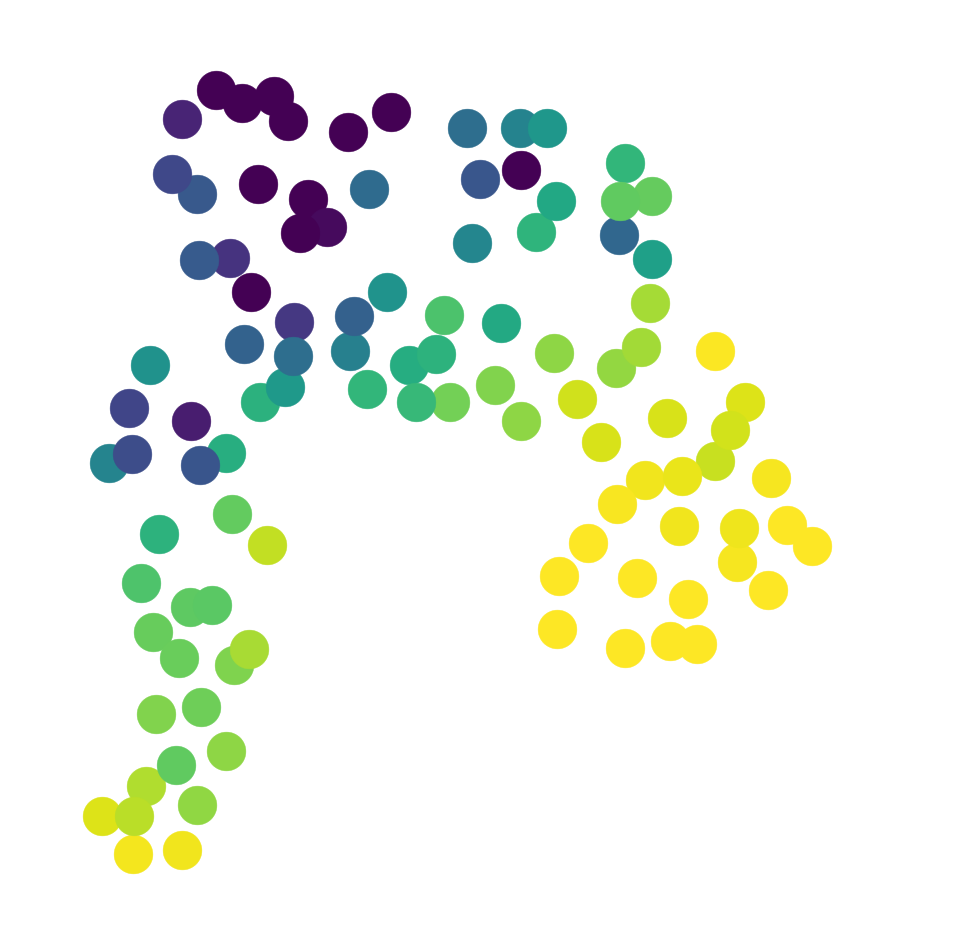

In [587]:
data = diffused_IRS_bwd
data -= np.percentile(data, 10)
data /= np.percentile(data, 90)
data = np.clip(data, 0, 1)

tsne = umap_ANA_IRS.ix[data.index]
cmap = plt.cm.viridis_r
time = cells_stage
vmin = 0.0
vmax = 1.0

#initialize figure

height = 17
width = 17

fig = plt.figure(facecolor = 'w', figsize = (width, height))

#define x- and y-limits

x_min, x_max = np.min(tsne['x']), np.max(tsne['x'])
y_min, y_max = np.min(tsne['y']), np.max(tsne['y'])
x_diff, y_diff = x_max - x_min, y_max - y_min

pad = 2.0

if x_diff > y_diff:
    xlim = (x_min - pad, x_max + pad)
    ylim = (y_min * (x_diff / y_diff) - pad, y_max * (x_diff / y_diff) + pad)

if x_diff < y_diff:
    xlim = (x_min * (y_diff/x_diff) - pad, x_max * (y_diff/x_diff) + pad)
    ylim = (y_min - pad, y_max + pad)

text_pad = 2

#draw groups

ax1 = plt.subplot()

ax1.set_xlim(xlim[0], xlim[1])
ax1.set_ylim(ylim[0], ylim[1])

remove_ticks(ax1)

for ix in tsne.index:

    ax1.scatter(tsne.ix[ix,'x'],
                tsne.ix[ix,'y'], 
                s = 1500,
                linewidth = 0.5,
                c = cmap((data[ix] - vmin) / (vmax - vmin)),
                edgecolor=cmap((data[ix] - vmin) / (vmax - vmin)))

clean_axis(ax1)

### Checkpoint

In [588]:
saveData_v1(diffused_IRS_fwd, path_output, exp_id, 'diffused_IRS_fwd')
saveData_v1(diffused_IRS_bwd, path_output, exp_id, 'diffused_IRS_bwd')

In [589]:
vlm_ana3.to_hdf5(path_output_vcy + exp_id + '_vlm_ana3.hdf5')

# Create diffusion pseudotime of HF matrix progeny

## Load data into scanpy

In [1046]:
seqN = loadData_v1(path_output, exp_id, 'seqN', 'DataFrame')
cl_c_2nd = loadData_v1(path_output, exp_id, 'cl_c_2nd', 'Series')
cl_c_ANA = cl_c_2nd[[ix for ix in cl_c_2nd.index if cl_c_2nd[ix].split()[0] == 'ANA']]

In [1047]:
cl_c_ANA_sel = cl_c_ANA[~cl_c_ANA.isin(['ANA - 0','ANA - 1', 'ANA - 2', 'ANA - 3', 'ANA - 20','ANA - 21',])]


Dropping unexpressed genes from dataset

After mean expression cutoff of 0.025, 7455 genes remain

After high variance feature selection, 2500 genes remain


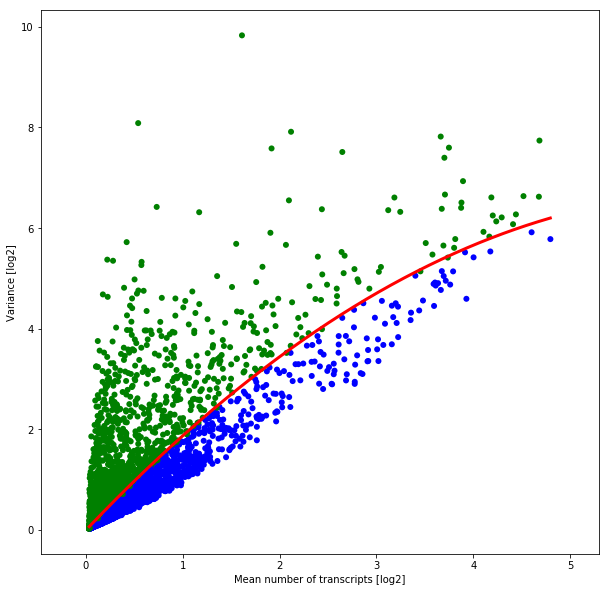

In [1048]:
seq_sel_ANA = select_features_log2_var_polyfit_v2(seqN[cl_c_ANA_sel.index], 0.025, 2500)

In [1049]:
scdata_ANA_sel = to_scanpy(seq_sel_ANA)

## Create diffusion map

In [1050]:
sc.pp.pca(scdata_ANA_sel, n_comps = 10)

In [1051]:
sc.pp.neighbors(scdata_ANA_sel, n_neighbors=5, method='gauss')

/Users/simjoo/anaconda/lib/python3.6/site-packages/scanpy/neighbors/__init__.py:123: RuntimeWarning: invalid value encountered in sqrt
  distances = np.sqrt(distances)


In [1052]:
sc.tl.diffmap(scdata_ANA_sel, n_comps=4)

In [1053]:
diffmap_ANA = pd.DataFrame(scdata_ANA_sel.obsm['X_diffmap'][:,1:], index = scdata_ANA_sel.obs['CellID'], columns = ['x','y','z'])

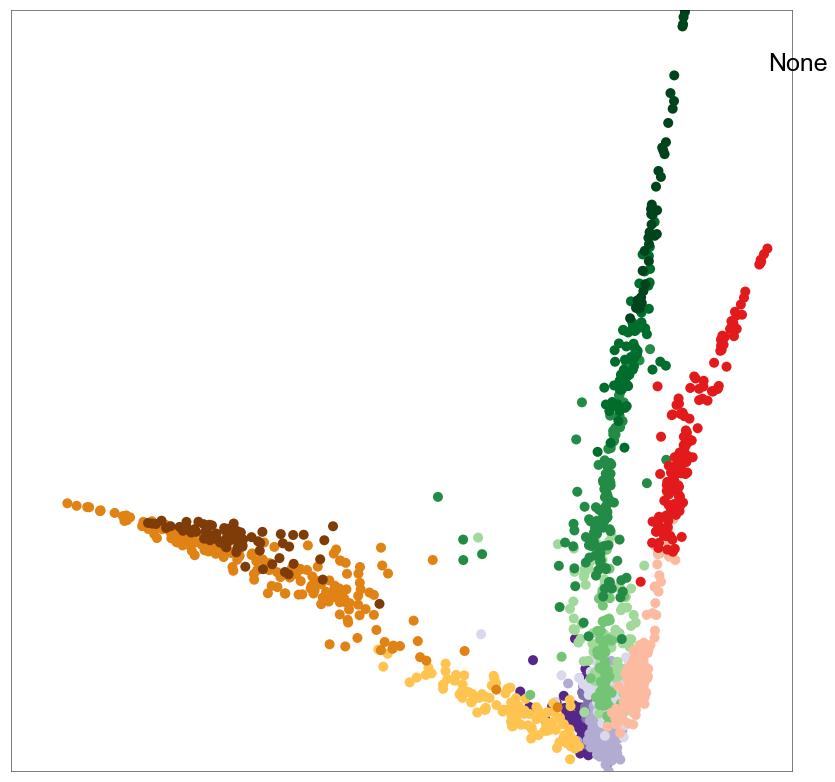

In [1055]:
draw_tSNE(diffmap_ANA, cl_c_ANA_sel, number = None, cmap = cmap_2nd)

### Checkpoint

In [1056]:
#saveData_v1(diffmap_ANA, path_output, exp_id, 'diffmap_ANA')

In [1057]:
diffmap_ANA = loadData_v1(path_output, exp_id, 'diffmap_ANA', 'DataFrame')

## Create diffusion pseudotime with root cell based on RNA velocity Markov model (defined in Notebook 4)

In [1058]:
scdata_ANA_sel.uns['iroot'] = 126 #ix from from velocity diffusion_bwd min

In [1059]:
sc.tl.dpt(scdata_ANA_sel, n_dcs = 4, allow_kendall_tau_shift=True)

In [1060]:
dpt_ANA = pd.Series(scdata_ANA_sel.obs['dpt_pseudotime'].values, index = scdata_ANA_sel.obs['CellID'])

/Users/simjoo/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:40: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated


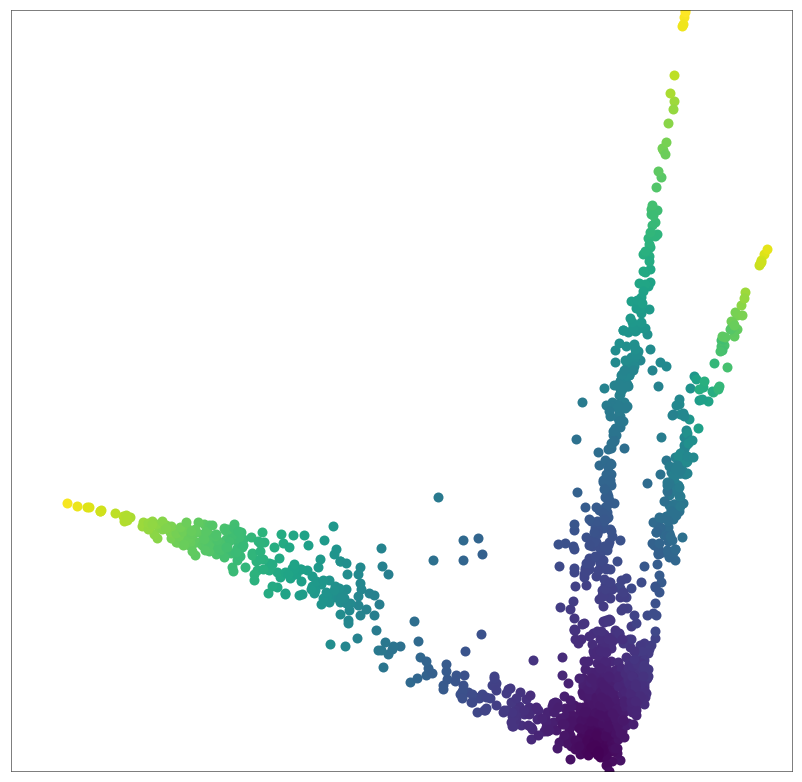

In [1063]:
draw_scatter_pseudotime(diffmap_ANA, dpt_ANA, cmap = plt.cm.viridis, pad = 0)

## Define diffusion map outliers using distance to MST diameter path

In [1064]:
dist_ANA_diff = PTO_pairwise_distance_eucl(diffmap_ANA)

In [1065]:
MST_ANA_diff, MST_ANA_diff_pos = PTO_create_MST(dist_ANA_diff)

/Users/simjoo/anaconda/lib/python3.6/site-packages/pygraphviz-1.4rc1-py3.6-macosx-10.7-x86_64.egg/pygraphviz/agraph.py:1334: RuntimeWarning: Warning: Could not load "/Users/simjoo/anaconda/lib/graphviz/libgvplugin_pango.6.dylib" - file not found

  warnings.warn(b"".join(errors).decode(self.encoding), RuntimeWarning)


/Users/simjoo/anaconda/lib/python3.6/site-packages/networkx/drawing/nx_pylab.py:522: MatplotlibDeprecationWarning: The is_string_like function was deprecated in version 2.1.
  if not cb.is_string_like(edge_color) \
/Users/simjoo/anaconda/lib/python3.6/site-packages/networkx/drawing/nx_pylab.py:543: MatplotlibDeprecationWarning: The is_string_like function was deprecated in version 2.1.
  if cb.is_string_like(edge_color) or len(edge_color) == 1:


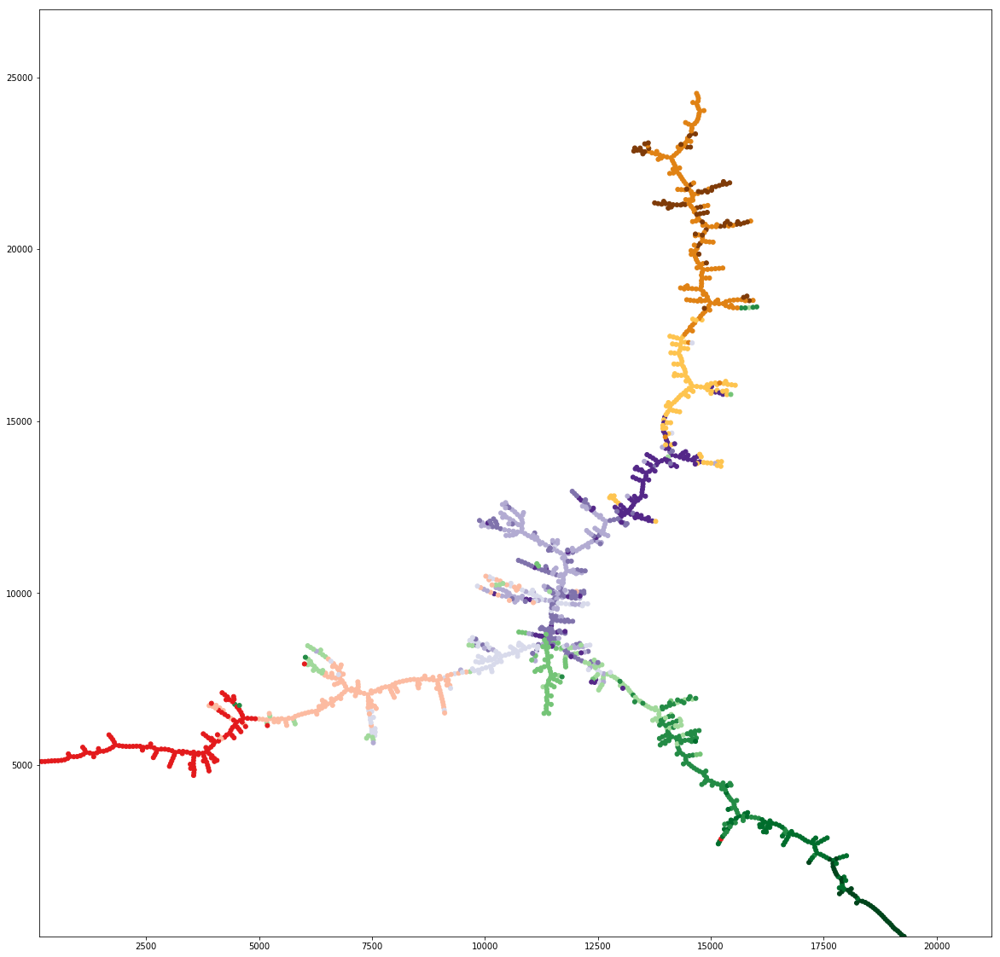

In [1066]:
PTO_draw_MST_groups(MST_ANA_diff, MST_ANA_diff_pos, nx.Graph(), cl_c_ANA, cmap = cmap_2nd, node_size = 25)

In [1067]:
MST_ANA_diff_pos_pd = pd.DataFrame(columns = ['x','y'])
for k in MST_ANA_diff_pos.keys(): MST_ANA_diff_pos_pd.loc[k] = MST_ANA_diff_pos[k]

In [1068]:
end_CL = MST_ANA_diff_pos_pd['y'].sort_values().index[-1]
end_CX = MST_ANA_diff_pos_pd['y'].sort_values().index[0]
end_IRS = MST_ANA_diff_pos_pd['x'].sort_values().index[0]

In [1069]:
diam_path_CL_CX = PTO_find_path(MST_ANA_diff, end_CL, end_CX)
diam_path_CL_IRS = PTO_find_path(MST_ANA_diff, end_CL, end_IRS)
diam_path_CX_IRS = PTO_find_path(MST_ANA_diff, end_CX, end_IRS)

In [1070]:
diam_path_nodes = list(set(diam_path_CL_CX[0]) | set(diam_path_CL_IRS[0]) | set(diam_path_CX_IRS[0]))
diam_path_edges = list(set(diam_path_CL_CX[1]) | set(diam_path_CL_IRS[1]) | set(diam_path_CX_IRS[1]))
G_diam_path = nx.Graph()
G_diam_path.add_nodes_from(diam_path_nodes)
G_diam_path.add_edges_from(diam_path_edges)

/Users/simjoo/anaconda/lib/python3.6/site-packages/networkx/drawing/nx_pylab.py:522: MatplotlibDeprecationWarning: The is_string_like function was deprecated in version 2.1.
  if not cb.is_string_like(edge_color) \
/Users/simjoo/anaconda/lib/python3.6/site-packages/networkx/drawing/nx_pylab.py:543: MatplotlibDeprecationWarning: The is_string_like function was deprecated in version 2.1.
  if cb.is_string_like(edge_color) or len(edge_color) == 1:


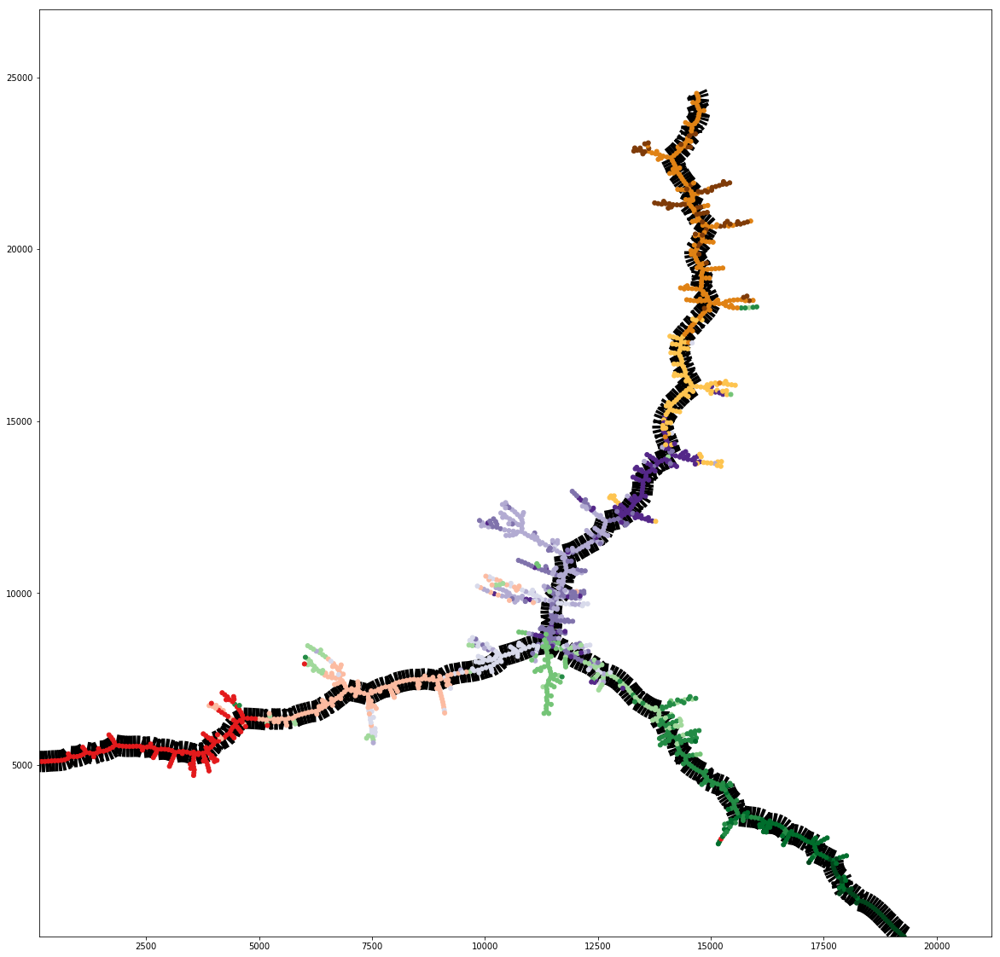

In [1071]:
PTO_draw_MST_groups(MST_ANA_diff, MST_ANA_diff_pos, G_diam_path, cl_c_ANA, cmap = cmap_2nd, node_size = 25, width_diam = 25)

In [1072]:
min_dist_to_diam = dist_ANA_diff[diam_path_nodes].min(axis=1)

In [1074]:
c_sel = min_dist_to_diam[min_dist_to_diam<0.01].index

In [1075]:
dpt_ANA = dpt_ANA[c_sel]

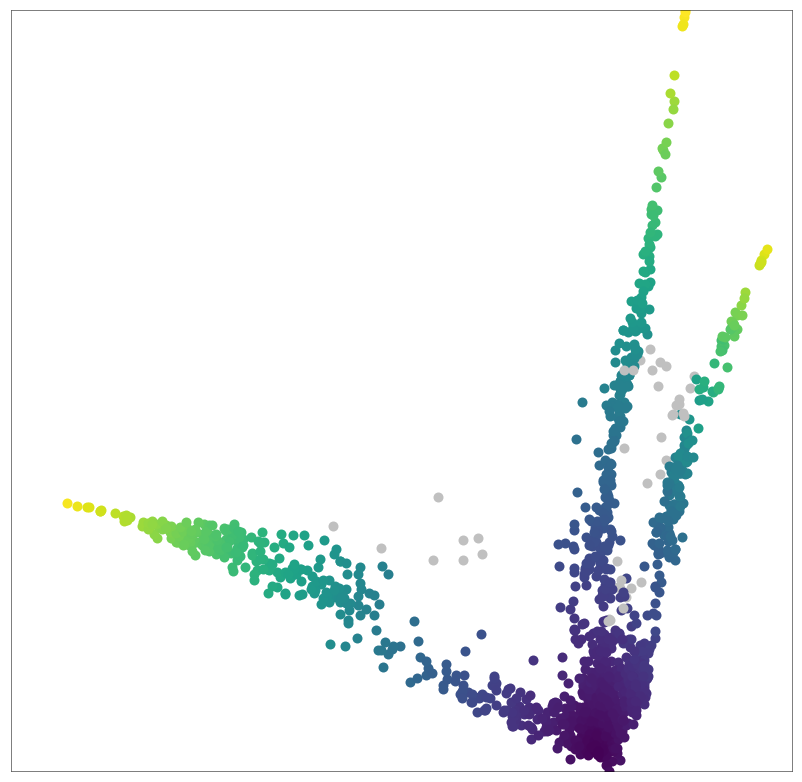

In [1076]:
draw_scatter_pseudotime(diffmap_ANA, dpt_ANA, cmap = plt.cm.viridis, pad = 0)

### Checkpoint

In [1077]:
#saveData_v1(dpt_ANA, path_output, exp_id, 'dpt_ANA')

In [1078]:
dpt_ANA = loadData_v1(path_output, exp_id, 'dpt_ANA', 'Series')

## Manually define branches based on clustering (and informed by RNA velocity)

In [705]:
c_sel_CL = cl_c_ANA[cl_c_ANA.isin(['ANA - 16','ANA - 17','ANA - 5', 'ANA - 4'])].index
c_sel_CL = [c for c in c_sel_CL if c in dpt_ANA.index]

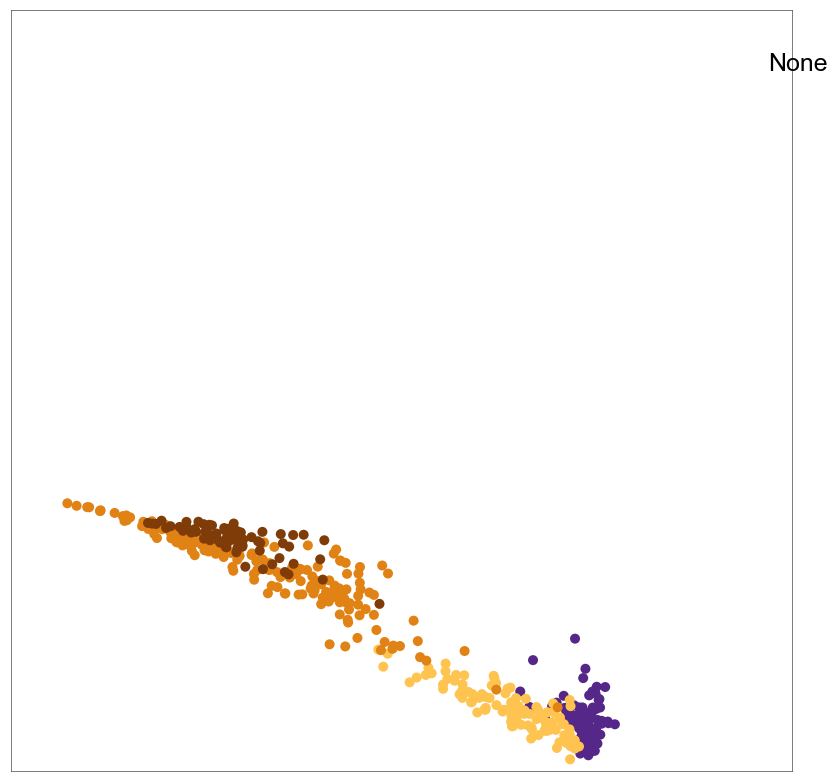

In [706]:
draw_tSNE(diffmap_ANA, cl_c_ANA_sel[c_sel_CL], number = None, cmap = cmap_2nd)

In [707]:
dpt_ANA_CL = dpt_ANA[c_sel_CL]

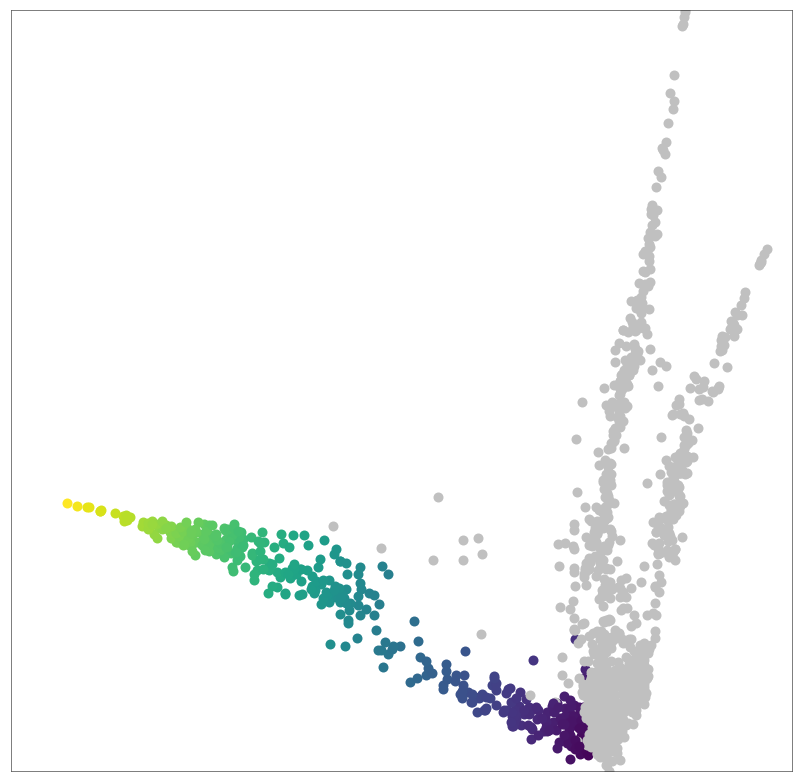

In [708]:
draw_scatter_pseudotime(diffmap_ANA, dpt_ANA_CL, cmap = plt.cm.viridis, pad = 0)

In [709]:
c_sel_CX = cl_c_ANA[cl_c_ANA.isin(['ANA - 16','ANA - 13','ANA - 15','ANA - 14','ANA - 6', 'ANA - 7', 'ANA - 10', 'ANA - 11'])].index
c_sel_CX = [c for c in c_sel_CX if c in dpt_ANA.index]

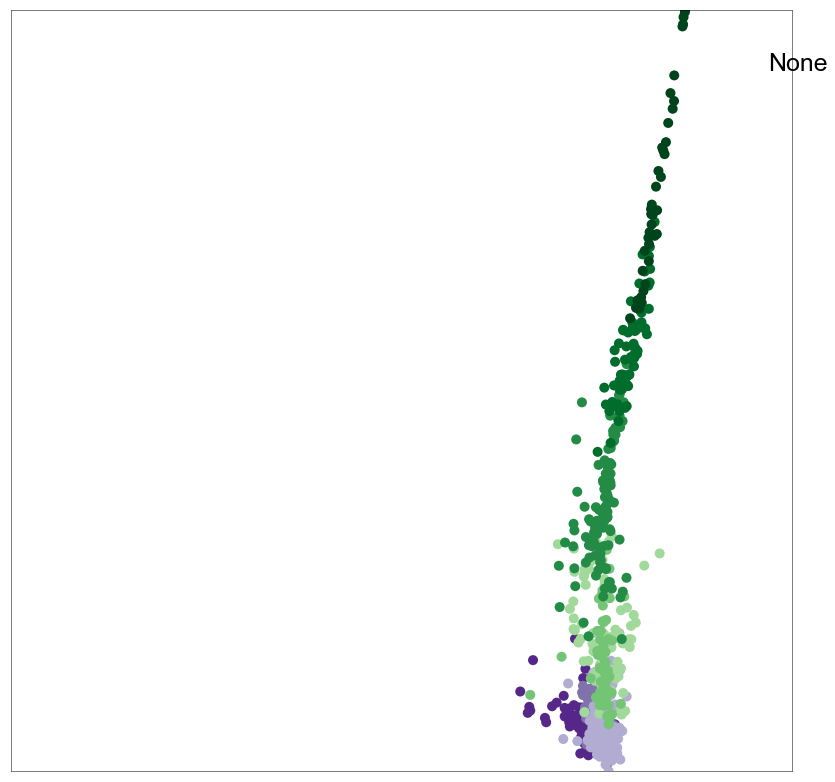

In [710]:
draw_tSNE(diffmap_ANA, cl_c_ANA_sel[c_sel_CX], number = None, cmap = cmap_2nd)

In [711]:
dpt_ANA_CX = dpt_ANA[c_sel_CX]

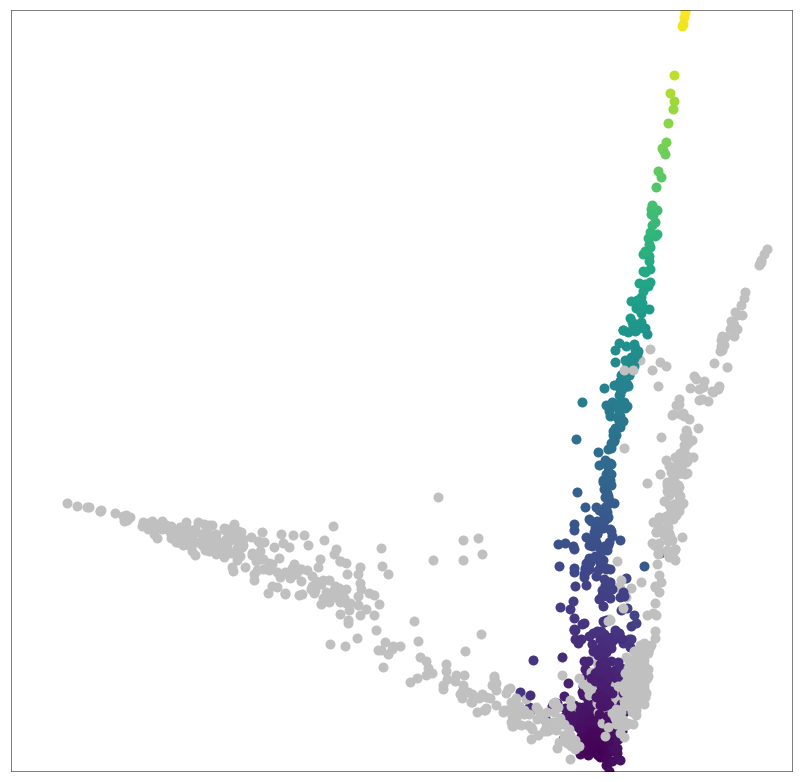

In [712]:
draw_scatter_pseudotime(diffmap_ANA, dpt_ANA_CX, cmap = plt.cm.viridis, pad = 0)

In [278]:
c_sel_IRS = cl_c_ANA[cl_c_ANA.isin(['ANA - 16','ANA - 13', 'ANA - 15', 'ANA - 12','ANA - 18','ANA - 8', 'ANA - 9'])].index
c_sel_IRS = [c for c in c_sel_IRS if c in dpt_ANA.index]

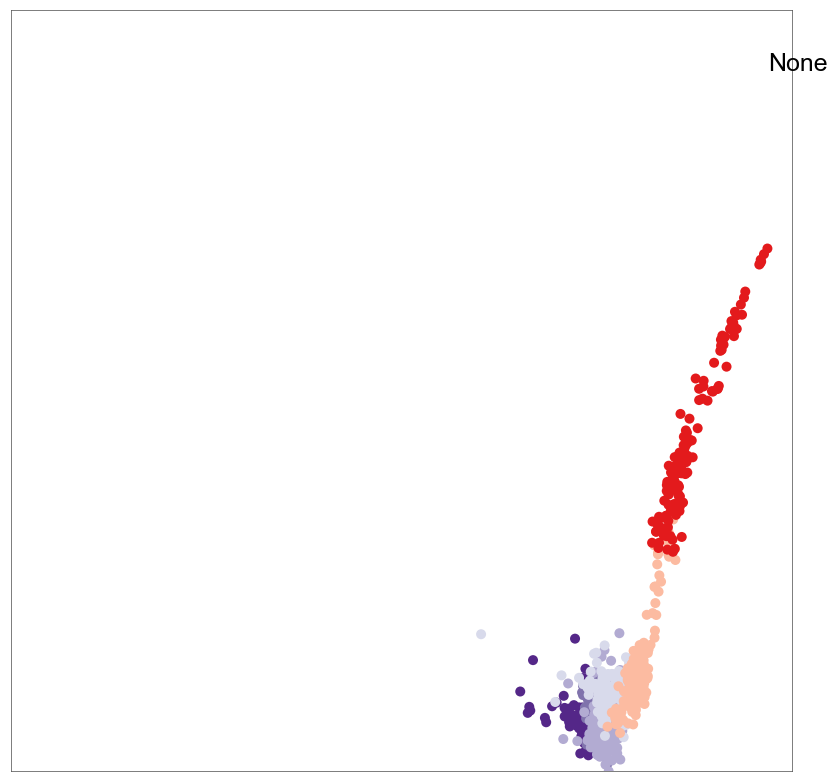

In [283]:
draw_tSNE(diffmap_ANA, cl_c_ANA_sel[c_sel_IRS], number = None, cmap = cmap_2nd)

In [284]:
dpt_ANA_IRS = dpt_ANA[c_sel_IRS]

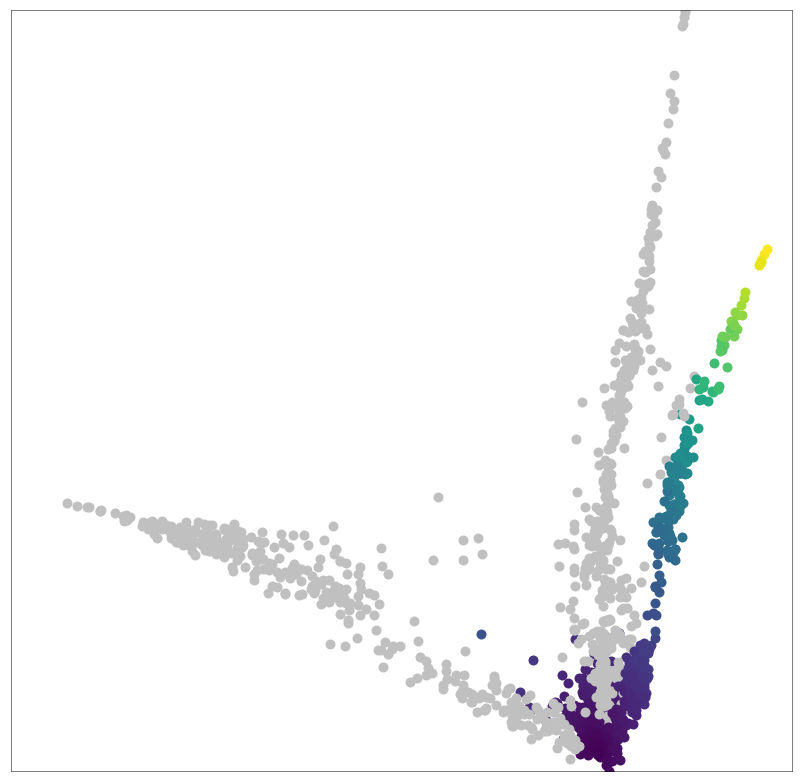

In [285]:
draw_scatter_pseudotime(diffmap_ANA, dpt_ANA_IRS, cmap = plt.cm.viridis, pad = 0)

### Checkpoint

In [286]:
#saveData_v1(dpt_ANA_CL, path_output, exp_id, 'dpt_ANA_CL')
#saveData_v1(dpt_ANA_CX, path_output, exp_id, 'dpt_ANA_CX')
#saveData_v1(dpt_ANA_IRS, path_output, exp_id, 'dpt_ANA_IRS')

In [1081]:
dpt_ANA_CL = loadData_v1(path_output, exp_id, 'dpt_ANA_CL', 'Series')
dpt_ANA_CX = loadData_v1(path_output, exp_id, 'dpt_ANA_CX', 'Series')
dpt_ANA_IRS = loadData_v1(path_output, exp_id, 'dpt_ANA_IRS', 'Series')

## Fit VGAM

In [312]:
seqN = loadData_v1(path_output, exp_id, 'seqN', 'DataFrame')
cl_c_2nd = loadData_v1(path_output, exp_id, 'cl_c_2nd', 'Series')
cl_c_ANA = cl_c_2nd[[ix for ix in cl_c_2nd.index if cl_c_2nd[ix].split()[0] == 'ANA']]

dpt_ANA = loadData_v1(path_output, exp_id, 'dpt_ANA', 'Series')
dpt_ANA_CL = loadData_v1(path_output, exp_id, 'dpt_ANA_CL', 'Series')
dpt_ANA_CX = loadData_v1(path_output, exp_id, 'dpt_ANA_CX', 'Series')
dpt_ANA_IRS = loadData_v1(path_output, exp_id, 'dpt_ANA_IRS', 'Series')

In [324]:
genes_sel = list(dropNull_v2X(seqN[cl_c_ANA.index], None, 0.05).index)


Dropping unexpressed genes from dataset


In [325]:
len(genes_sel)

5872

In [326]:
np.random.shuffle(genes_sel)

In [327]:
branches_ANA = pd.DataFrame(0, index = dpt_ANA.index, columns = ['root','CL','CX','IRS'])

c_sel_root = cl_c_ANA.loc[dpt_ANA.index][cl_c_ANA.loc[dpt_ANA.index]=='ANA - 16'].index
branches_ANA.loc[c_sel_root, 'root'] = 1

branches_ANA.loc[dpt_ANA_CL.index, 'CL'] = 1
branches_ANA.loc[dpt_ANA_CX.index, 'CX'] = 1
branches_ANA.loc[dpt_ANA_IRS.index, 'IRS'] = 1

In [329]:
#ANA_fitted, ANA_stats = fit_vgam_v3r(seqN, dpt_ANA, branches_ANA, 'root', genes_sel, path_output, exp_id, 'ANA',
                                    #df=3, neg_log = False, steps = 101, checkpoint_after = 100)

# Get branch specific data

In [330]:
ANA_fitted = loadData_from_pickle_v1(path_output, exp_id, 'ANA_fitted')
ANA_stats = loadData_from_pickle_v1(path_output, exp_id, 'ANA_stats')

In [331]:
print(np.round(dpt_ANA_CL.min(),2), np.round(dpt_ANA_CL.max(),2))
print(np.round(dpt_ANA_CX.min(),2), np.round(dpt_ANA_CX.max(),2))
print(np.round(dpt_ANA_IRS.min(),2), np.round(dpt_ANA_IRS.max(),2))

0.0 0.99
0.0 1.0
0.0 0.96


In [332]:
ANA_fitted_CL = ANA_fitted.loc['CL'][ANA_fitted.columns[0:100]]
ANA_fitted_CX = ANA_fitted.loc['CX'][ANA_fitted.columns[0:]]
ANA_fitted_IRS = ANA_fitted.loc['IRS'][ANA_fitted.columns[0:97]]

In [333]:
ANA_stats_CL = ANA_stats.loc['CL']
ANA_stats_CX = ANA_stats.loc['CX']
ANA_stats_IRS = ANA_stats.loc['IRS']

# Approximate area between curves for full vs. reduced & null model

In [335]:
ANA_ABC_CL_vs_null = approx_ABC(ANA_fitted[ANA_fitted.columns[0:100]], 'CL', 'null')
ANA_ABC_CX_vs_null = approx_ABC(ANA_fitted[ANA_fitted.columns[0:]], 'CX', 'null')
ANA_ABC_IRS_vs_null = approx_ABC(ANA_fitted[ANA_fitted.columns[0:97]], 'IRS', 'null')

### Checkpoint

In [336]:
saveData_to_pickle_v1(ANA_ABC_CL_vs_null, path_output, exp_id, 'ANA_ABC_CL_vs_null')
saveData_to_pickle_v1(ANA_ABC_CX_vs_null, path_output, exp_id, 'ANA_ABC_CX_vs_null')
saveData_to_pickle_v1(ANA_ABC_IRS_vs_null, path_output, exp_id, 'ANA_ABC_IRS_vs_null')

# Get max expression

In [577]:
ANA_fitted_CL_max = ANA_fitted_CL.max(axis=1)
ANA_fitted_CX_max = ANA_fitted_CX.max(axis=1)
ANA_fitted_IRS_max = ANA_fitted_IRS.max(axis=1)

# Get fold change with branch (amplitude)

In [554]:
def pt_get_fc(data):
        
    output = pd.Series(np.log2((data.max(axis=1) / data.min(axis=1)).astype(float)).values, 
                       index = data.index)
    return output

In [556]:
fc_dpt_ANA_CL = pt_get_fc(ANA_fitted_CL)
fc_dpt_ANA_CX = pt_get_fc(ANA_fitted_CX)
fc_dpt_ANA_IRS = pt_get_fc(ANA_fitted_IRS)

# Get fold change with null model

In [558]:
def pt_get_fc_vs(data, c1, c2):
        
    output = pd.Series(np.abs(np.log2((data.loc[c1] / data.loc[c2]).astype(float))).max(axis=1), 
                       index = data.loc[c1].index)
    return output

In [559]:
fc_dpt_ANA_CL_vs_null = pt_get_fc_vs(ANA_fitted[ANA_fitted.columns[0:100]], 'CL', 'null')
fc_dpt_ANA_CX_vs_null = pt_get_fc_vs(ANA_fitted[ANA_fitted.columns[0:]], 'CX', 'null')
fc_dpt_ANA_IRS_vs_null = pt_get_fc_vs(ANA_fitted[ANA_fitted.columns[0:97]], 'IRS', 'null')

# Cluster pseudotime dependent genes (compared to null model; based on correlated expression patterns)

### Deselect genes which produced NaN

In [545]:
g_rem = []

for ix in ANA_fitted.index.levels[0]:
    g_rem += list(ANA_fitted.loc[ix].isna().sum(axis=1)[ANA_fitted.loc[ix].isna().sum(axis=1)>0].index)

for ix in ANA_stats.index.levels[0]:
    g_rem += list(ANA_stats.loc[ix].isna().sum(axis=1)[ANA_stats.loc[ix].isna().sum(axis=1)>0].index) 
    
g_rem = list(set(g_rem))

In [546]:
len(g_rem)

63

In [547]:
genes_sel = [g for g in ANA_fitted.index.levels[1] if g not in g_rem]

In [548]:
len(genes_sel)

5809

## Companion layer

In [597]:
pt_thr = 0.001
fc_thr = 1
fc_thr_null = 1
max_expr = 0.25

In [598]:
genes_sel_CL = ANA_stats_CL.loc[genes_sel,'Pr(>Chisq)-BH_null'][ANA_stats_CL.loc[genes_sel,'Pr(>Chisq)-BH_null']<pt_thr].index
genes_sel_CL = fc_dpt_ANA_CL.loc[genes_sel_CL][fc_dpt_ANA_CL.loc[genes_sel_CL]>fc_thr].index
genes_sel_CL = fc_dpt_ANA_CL_vs_null.loc[genes_sel_CL][fc_dpt_ANA_CL_vs_null.loc[genes_sel_CL]>fc_thr].index
genes_sel_CL = ANA_fitted_CL_max.loc[genes_sel_CL][ANA_fitted_CL_max.loc[genes_sel_CL]>max_expr].index

In [599]:
len(genes_sel_CL)

998

In [600]:
corr_genes_CL = ANA_fitted_CL.loc[genes_sel_CL].astype(float).T.corr()

In [632]:
cl_g_PT_CL =  AP_clustering_v4P(corr_genes_CL, 0, -5, 0.7)

In [633]:
len(set(cl_g_PT_CL))

8

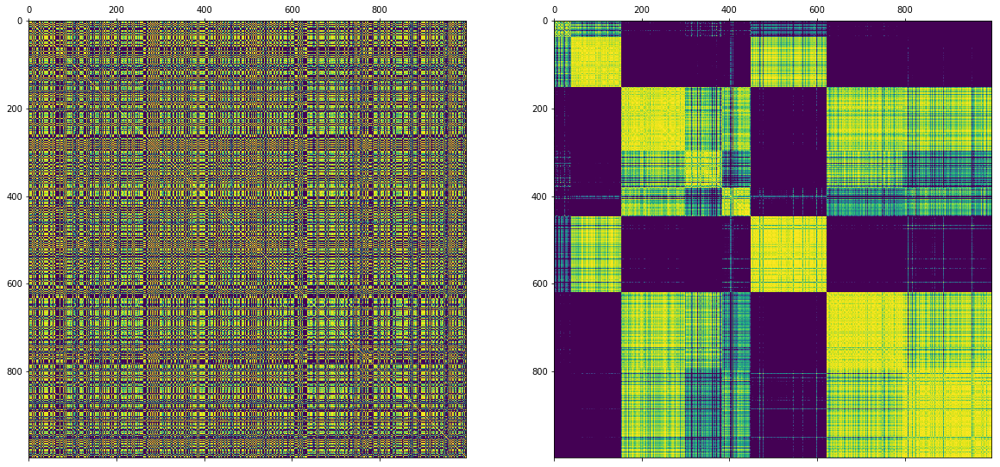

In [634]:
draw_AP_dist_mat(corr_genes_CL, cl_g_PT_CL, cmap = plt.cm.viridis, vmin = 0.0, vmax = 1.0)

### Checkpoint

In [635]:
saveData_v1(cl_g_PT_CL, path_output, exp_id, 'cl_g_PT_CL')

## Cortex (CX)

In [636]:
pt_thr = 0.001
fc_thr = 1
fc_thr_null = 1
max_expr = 0.25

In [638]:
genes_sel_CX = ANA_stats_CX.loc[genes_sel,'Pr(>Chisq)-BH_null'][ANA_stats_CX.loc[genes_sel,'Pr(>Chisq)-BH_null']<pt_thr].index
genes_sel_CX = fc_dpt_ANA_CX.loc[genes_sel_CX][fc_dpt_ANA_CX.loc[genes_sel_CX]>fc_thr].index
genes_sel_CX = fc_dpt_ANA_CX_vs_null.loc[genes_sel_CX][fc_dpt_ANA_CX_vs_null.loc[genes_sel_CX]>fc_thr].index
genes_sel_CX = ANA_fitted_CX_max.loc[genes_sel_CX][ANA_fitted_CX_max.loc[genes_sel_CX]>max_expr].index

In [639]:
len(genes_sel_CX)

1114

In [640]:
corr_genes_CX = ANA_fitted_CX.loc[genes_sel_CX].astype(float).T.corr()

In [641]:
cl_g_PT_CX =  AP_clustering_v4P(corr_genes_CX, 0, -6, 0.75)

In [642]:
len(set(cl_g_PT_CX))

8

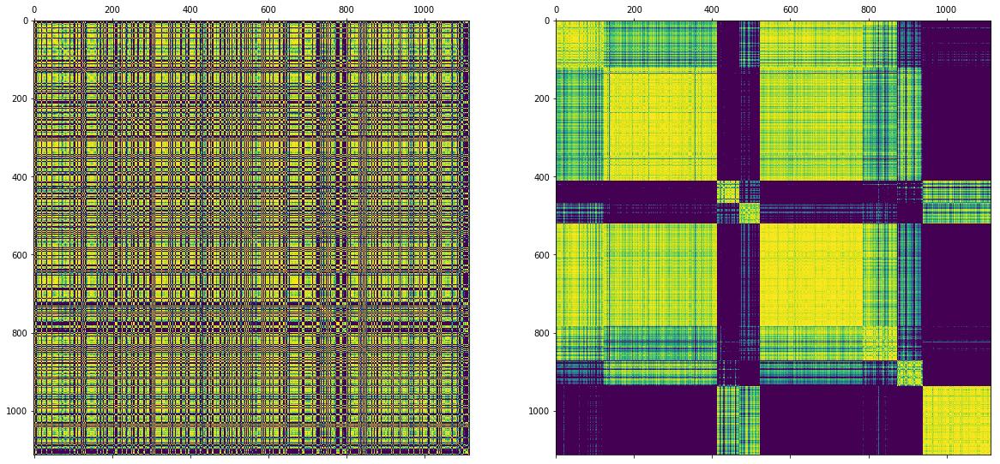

In [643]:
draw_AP_dist_mat(corr_genes_CX, cl_g_PT_CX, cmap = plt.cm.viridis, vmin = 0.0, vmax = 1.0)

### Checkpoint

In [644]:
saveData_v1(cl_g_PT_CX, path_output, exp_id, 'cl_g_PT_CX')

## Inner root sheath

In [645]:
pt_thr = 0.001
fc_thr = 1
fc_thr_null = 1
max_expr = 0.25

In [657]:
genes_sel_IRS = ANA_stats_IRS.loc[genes_sel,'Pr(>Chisq)-BH_null'][ANA_stats_IRS.loc[genes_sel,'Pr(>Chisq)-BH_null']<pt_thr].index
genes_sel_IRS = fc_dpt_ANA_IRS.loc[genes_sel_IRS][fc_dpt_ANA_IRS.loc[genes_sel_IRS]>fc_thr].index
genes_sel_IRS = fc_dpt_ANA_IRS_vs_null.loc[genes_sel_IRS][fc_dpt_ANA_IRS_vs_null.loc[genes_sel_IRS]>fc_thr].index
genes_sel_IRS = ANA_fitted_IRS_max.loc[genes_sel_IRS][ANA_fitted_IRS_max.loc[genes_sel_IRS]>max_expr].index

In [658]:
len(genes_sel_IRS)

1194

In [659]:
corr_genes_IRS = ANA_fitted_IRS.loc[genes_sel_IRS].astype(float).T.corr()

In [660]:
cl_g_PT_IRS =  AP_clustering_v4P(corr_genes_IRS, 0, -8, 0.8)

In [661]:
len(set(cl_g_PT_IRS))

8

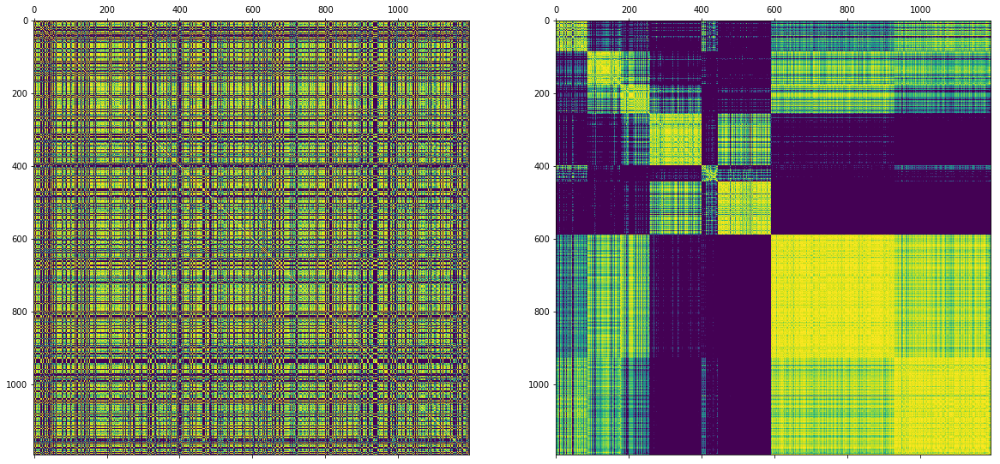

In [662]:
draw_AP_dist_mat(corr_genes_IRS, cl_g_PT_IRS, cmap = plt.cm.viridis, vmin = 0.0, vmax = 1.0)

### Checkpoint

In [663]:
saveData_v1(cl_g_PT_IRS, path_output, exp_id, 'cl_g_PT_IRS')

# Model IRS differentiation with pseudotime in diffusion map space

## Load data into scanpy

In [101]:
seqN = loadData_v1(path_output, exp_id, 'seqN', 'DataFrame')
cl_c_ANA_IRS = loadData_v1(path_output, exp_id, 'cl_c_ANA_IRS', 'Series')

In [102]:
c_sel_IRS = cl_c_ANA[cl_c_ANA]


Dropping unexpressed genes from dataset

After mean expression cutoff of 0.025, 7218 genes remain

After high variance feature selection, 2500 genes remain


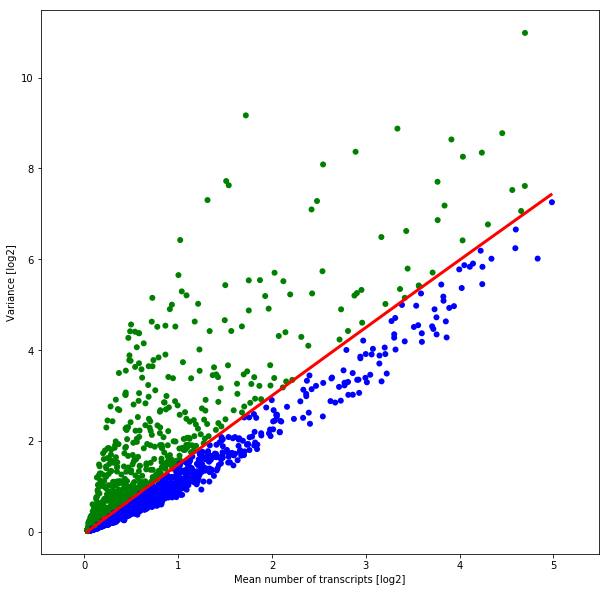

In [103]:
seq_sel_ANA_IRS = select_features_log2_var_polyfit_v2(seqN[cl_c_ANA_IRS.index], 0.025, 2500)

In [104]:
scdata_ANA_IRS = to_scanpy(seq_sel_ANA_IRS)

## Create diffusion map of IRS

In [174]:
sc.pp.pca(scdata_ANA_IRS, n_comps = 3)

In [175]:
sc.pp.neighbors(scdata_ANA_IRS, n_neighbors=10)

/Users/simjoo/anaconda/lib/python3.6/site-packages/scanpy/neighbors/__init__.py:123: RuntimeWarning: invalid value encountered in sqrt
  distances = np.sqrt(distances)


In [176]:
sc.tl.diffmap(scdata_ANA_IRS, n_comps=4)

In [177]:
diffmap_IRS = pd.DataFrame(scdata_ANA_IRS.obsm['X_diffmap'][:,1:], 
                           index = scdata_ANA_IRS.obs['CellID'], columns = ['x','y','z'])

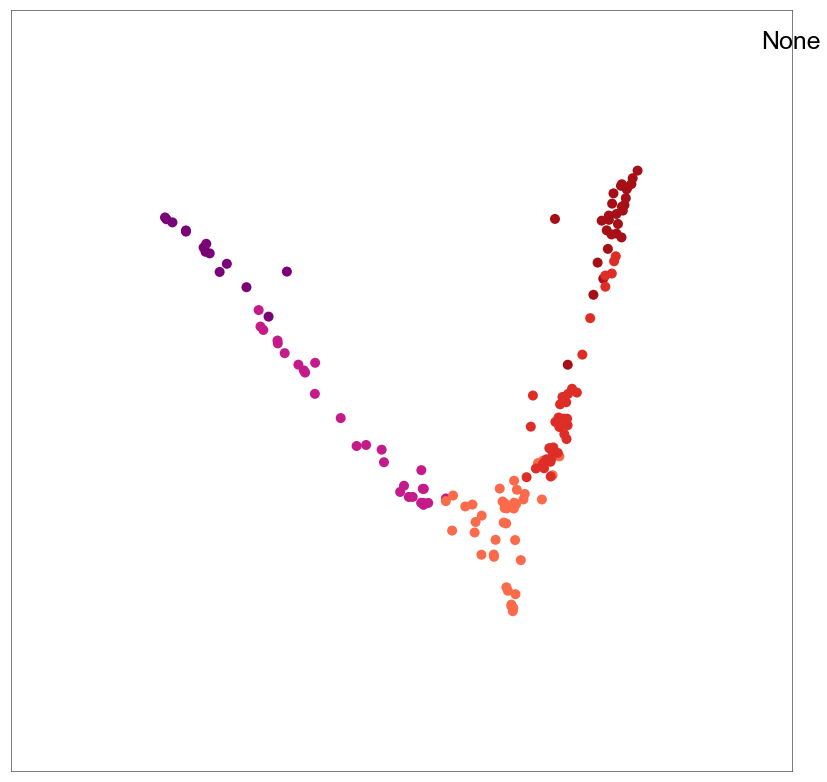

In [178]:
draw_tSNE(diffmap_IRS, cl_c_ANA_IRS, number = None, cmap = cmap_2nd, pad = 0.1)

### Checkpoint

In [106]:
#saveData_v1(diffmap_IRS, path_output, exp_id, 'diffmap_IRS')

In [107]:
diffmap_IRS = loadData_v1(path_output, exp_id, 'diffmap_IRS', 'DataFrame')

## Create diffusion pseudotime with root cell based on RNA velocity Markov model (defined in Notebook 4)

In [287]:
diffused_IRS_bwd = loadData_v1(path_output, exp_id, 'diffused_IRS_bwd', 'Series')

In [288]:
diffused_IRS_bwd.sort_values().index[-1]

'AACATTGAGAGGCA-5w'

In [289]:
scdata_ANA_IRS.obs['CellID'][scdata_ANA_IRS.obs['CellID']=='AACATTGAGAGGCA-5w'].index

Int64Index([86], dtype='int64')

In [290]:
scdata_ANA_IRS.uns['iroot'] = 86

In [291]:
sc.tl.dpt(scdata_ANA_IRS, n_dcs = 4, allow_kendall_tau_shift=True)

In [292]:
dpt_ANA_IRS = pd.Series(scdata_ANA_IRS.obs['dpt_pseudotime'].values, index = scdata_ANA_IRS.obs['CellID'])

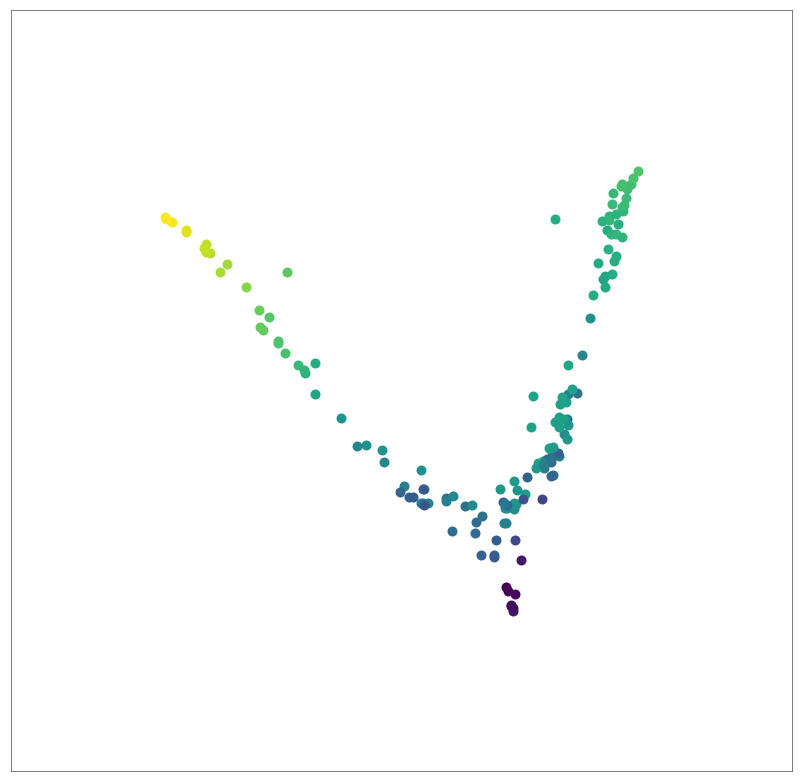

In [293]:
draw_scatter_pseudotime(diffmap_IRS, dpt_ANA_IRS, cmap = plt.cm.viridis, pad = 0.1)

## Define diffusion map outliers using distance to MST diameter path

In [294]:
dist_ANA_IRS_diff = PTO_pairwise_distance_eucl(diffmap_IRS)

In [295]:
MST_ANA_IRS_diff, MST_ANA_IRS_diff_pos = PTO_create_MST(dist_ANA_IRS_diff)

/Users/simjoo/anaconda/lib/python3.6/site-packages/pygraphviz-1.4rc1-py3.6-macosx-10.7-x86_64.egg/pygraphviz/agraph.py:1334: RuntimeWarning: Warning: Could not load "/Users/simjoo/anaconda/lib/graphviz/libgvplugin_pango.6.dylib" - file not found

  warnings.warn(b"".join(errors).decode(self.encoding), RuntimeWarning)


/Users/simjoo/anaconda/lib/python3.6/site-packages/networkx/drawing/nx_pylab.py:522: MatplotlibDeprecationWarning: The is_string_like function was deprecated in version 2.1.
  if not cb.is_string_like(edge_color) \
/Users/simjoo/anaconda/lib/python3.6/site-packages/networkx/drawing/nx_pylab.py:543: MatplotlibDeprecationWarning: The is_string_like function was deprecated in version 2.1.
  if cb.is_string_like(edge_color) or len(edge_color) == 1:


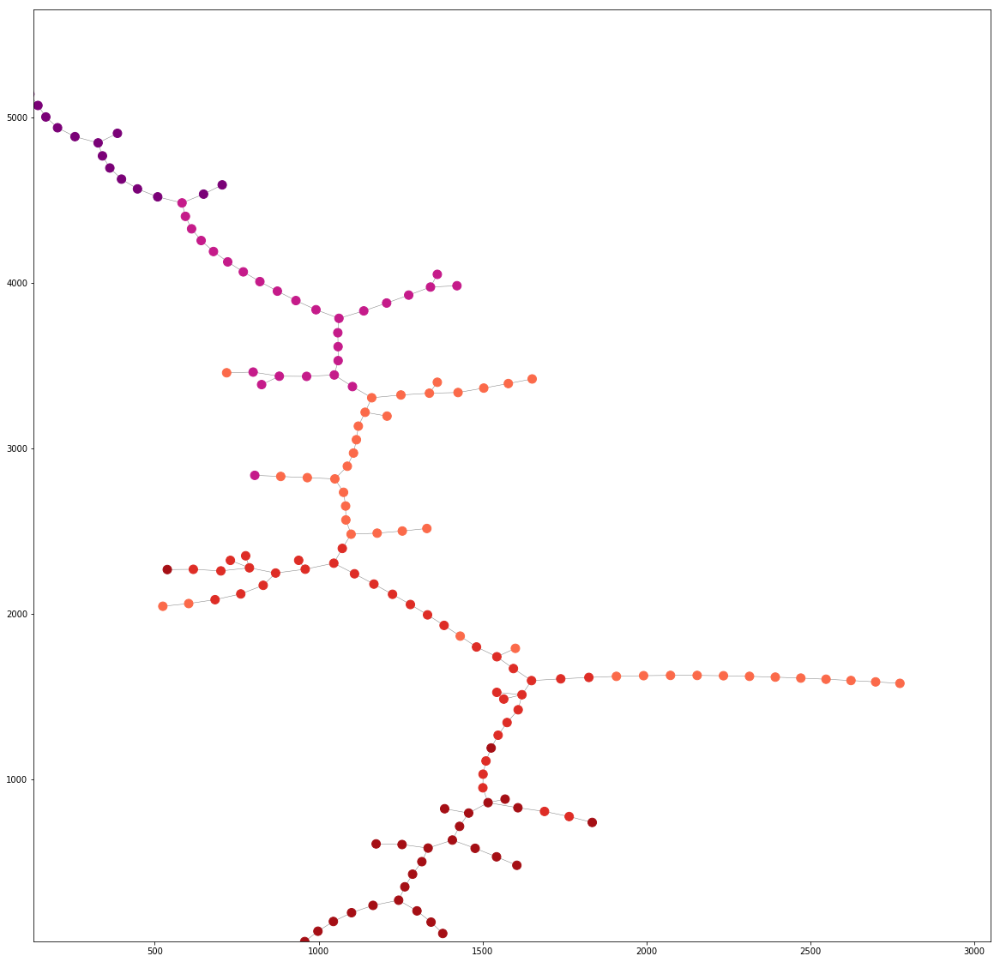

In [296]:
PTO_draw_MST_groups(MST_ANA_IRS_diff, MST_ANA_IRS_diff_pos, nx.Graph(), cl_c_ANA_IRS, cmap = cmap_2nd, node_size = 100)

In [297]:
MST_ANA_IRS_diff_pos_pd = pd.DataFrame(columns = ['x','y'])
for k in MST_ANA_IRS_diff_pos.keys(): MST_ANA_IRS_diff_pos_pd.loc[k] = MST_ANA_IRS_diff_pos[k]

In [298]:
root_IRS = MST_ANA_IRS_diff_pos_pd['x'].sort_values().index[-1]
end_IRS1 = MST_ANA_IRS_diff_pos_pd['y'].sort_values().index[-1]
end_IRS2 = MST_ANA_IRS_diff_pos_pd['y'].sort_values().index[0]

In [299]:
diam_path_IRS1 = PTO_find_path(MST_ANA_IRS_diff, root_IRS, end_IRS1)
diam_path_IRS2 = PTO_find_path(MST_ANA_IRS_diff, root_IRS, end_IRS2)

In [300]:
diam_path_nodes = list(set(diam_path_IRS1[0]) | set(diam_path_IRS2[0]))
diam_path_edges = list(set(diam_path_IRS1[1]) | set(diam_path_IRS2[1]))
G_diam_path = nx.Graph()
G_diam_path.add_nodes_from(diam_path_nodes)
G_diam_path.add_edges_from(diam_path_edges)

/Users/simjoo/anaconda/lib/python3.6/site-packages/networkx/drawing/nx_pylab.py:522: MatplotlibDeprecationWarning: The is_string_like function was deprecated in version 2.1.
  if not cb.is_string_like(edge_color) \
/Users/simjoo/anaconda/lib/python3.6/site-packages/networkx/drawing/nx_pylab.py:543: MatplotlibDeprecationWarning: The is_string_like function was deprecated in version 2.1.
  if cb.is_string_like(edge_color) or len(edge_color) == 1:


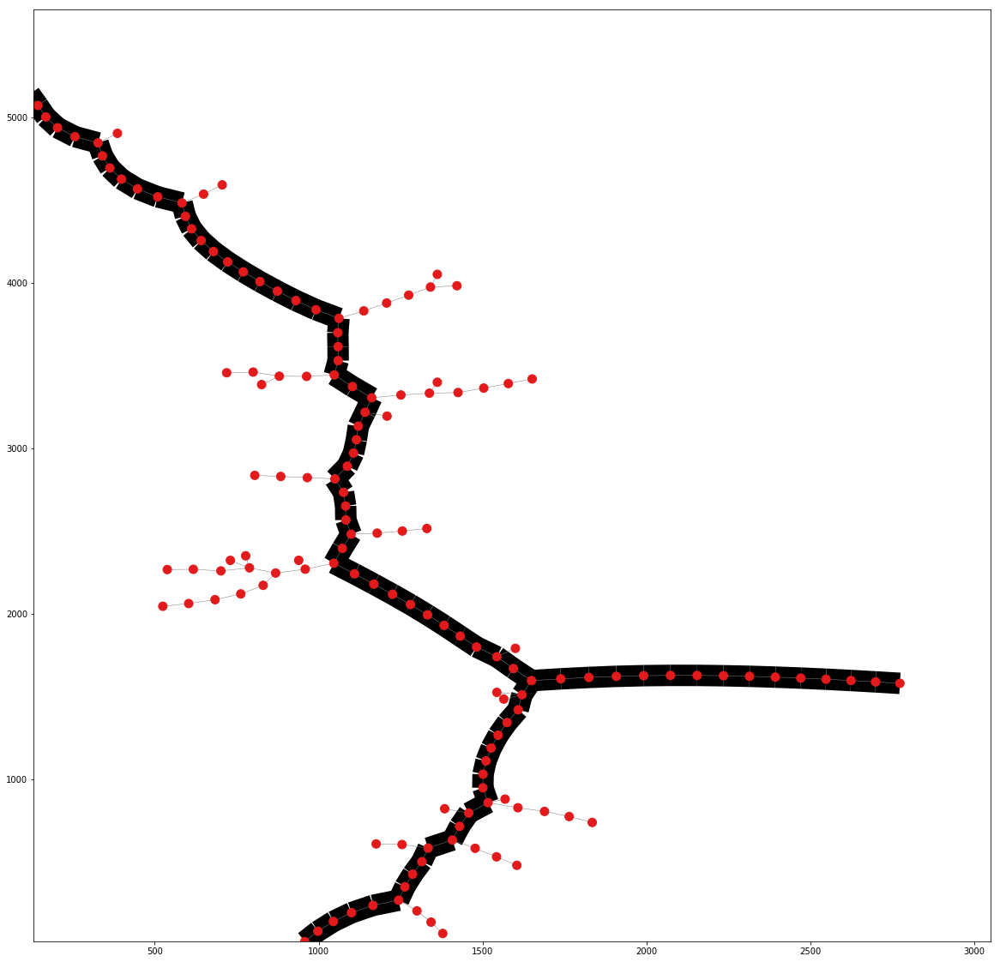

In [301]:
PTO_draw_MST_groups(MST_ANA_IRS_diff, MST_ANA_IRS_diff_pos, G_diam_path, cl_c_ANA, cmap = cmap_2nd, node_size = 100, width_diam = 25)

In [302]:
min_dist_to_diam = dist_ANA_IRS_diff[diam_path_nodes].min(axis=1)

In [304]:
c_sel = min_dist_to_diam[min_dist_to_diam<0.075].index

In [305]:
dpt_ANA_IRS = dpt_ANA_IRS[c_sel]

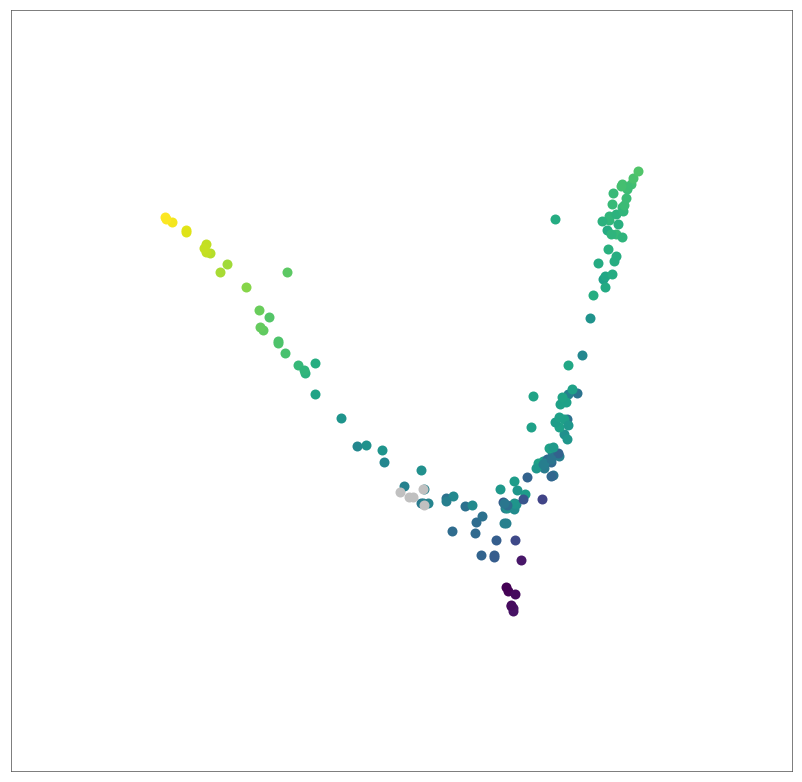

In [306]:
draw_scatter_pseudotime(diffmap_IRS, dpt_ANA_IRS, cmap = plt.cm.viridis, pad = 0.1)

### Checkpoint

In [109]:
#saveData_v1(dpt_ANA_IRS, path_output, exp_id, 'dpt_IRS')

In [110]:
dpt_ANA_IRS = loadData_v1(path_output, exp_id, 'dpt_ANA_IRS', 'Series')

## Manually define branches based on clustering (and informed by RNA velocity)

In [238]:
c_sel_IRS1 = cl_c_ANA_IRS[cl_c_ANA_IRS.isin(['ANA - IRS - 3','ANA - IRS - 4','ANA - IRS - 1',])].index
c_sel_IRS1 = [c for c in c_sel_IRS1 if c in dpt_ANA_IRS.index]

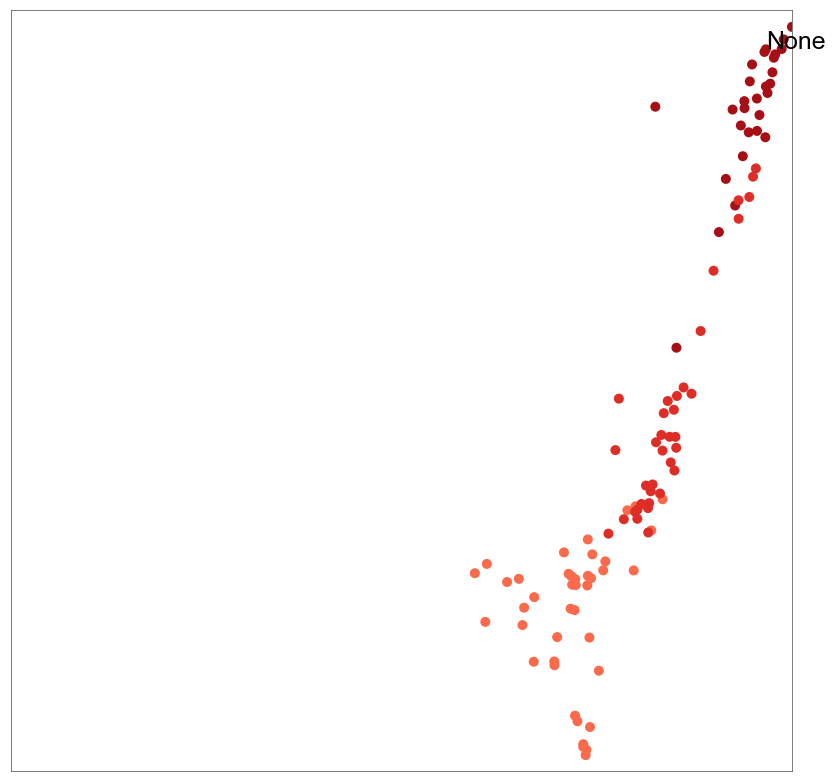

In [239]:
draw_tSNE(diffmap_IRS, cl_c_ANA_IRS[c_sel_IRS1], number = None, cmap = cmap_2nd)

In [240]:
dpt_ANA_IRS1 = dpt_ANA_IRS[c_sel_IRS1]

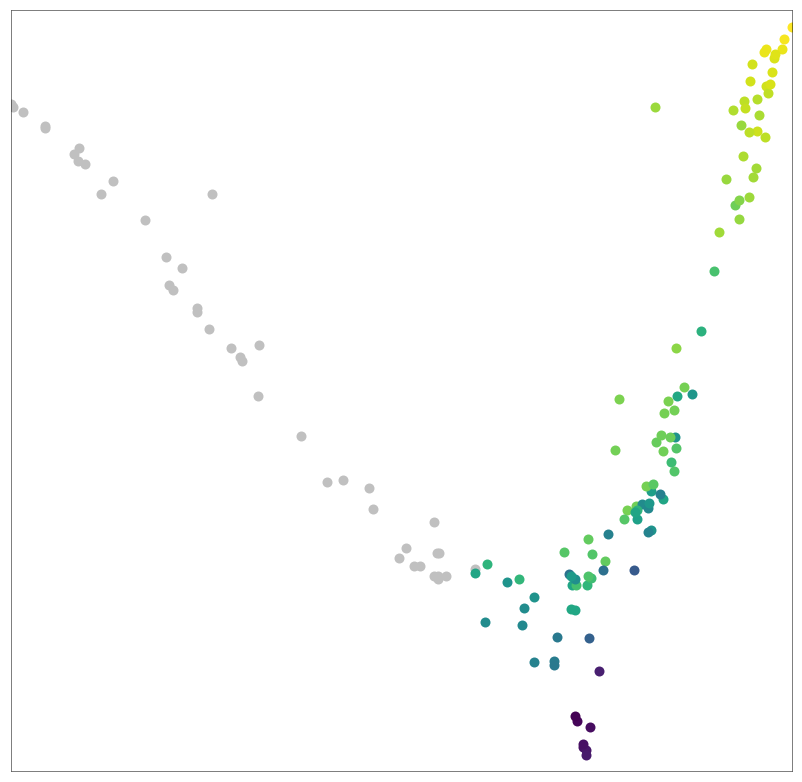

In [241]:
draw_scatter_pseudotime(diffmap_IRS, dpt_ANA_IRS1, cmap = plt.cm.viridis, pad = 0)

In [242]:
c_sel_IRS2 = cl_c_ANA_IRS[cl_c_ANA_IRS.isin(['ANA - IRS - 3','ANA - IRS - 2','ANA - IRS - 0',])].index
c_sel_IRS2 = [c for c in c_sel_IRS2 if c in dpt_ANA_IRS.index]

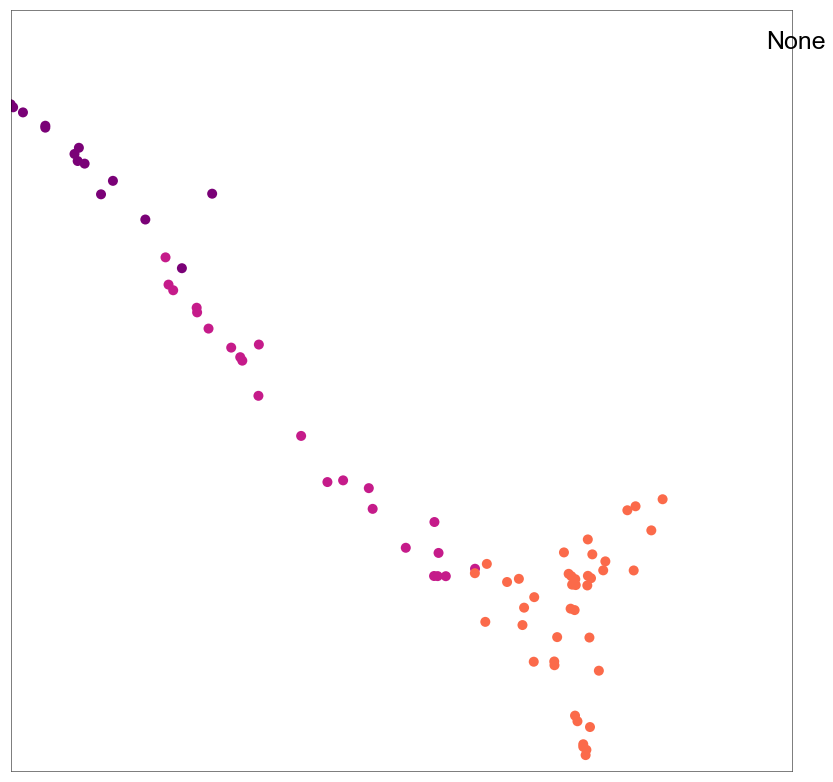

In [243]:
draw_tSNE(diffmap_IRS, cl_c_ANA_IRS[c_sel_IRS2], number = None, cmap = cmap_2nd)

In [244]:
dpt_ANA_IRS2 = dpt_ANA_IRS[c_sel_IRS2]

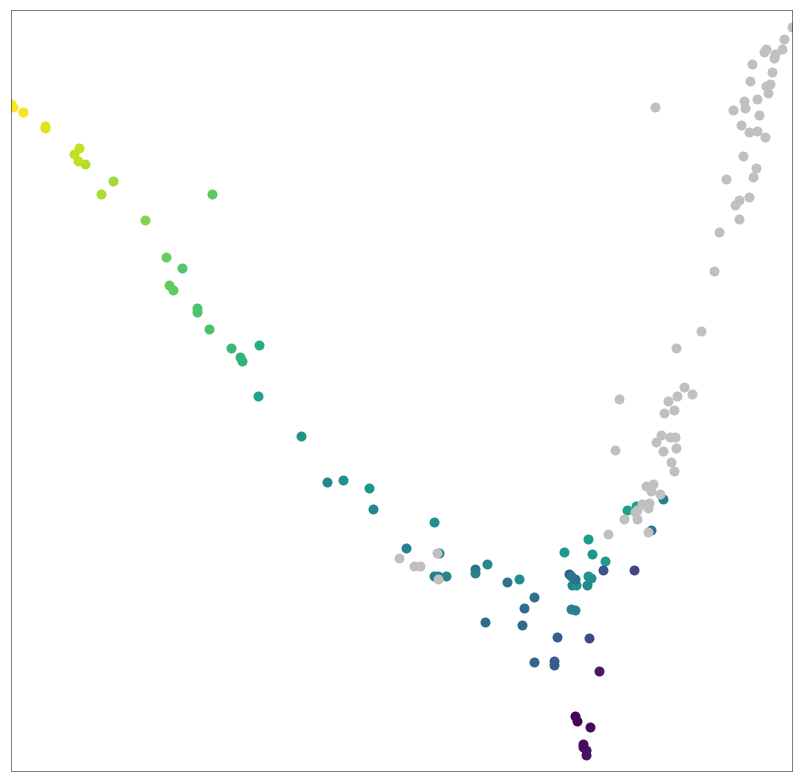

In [245]:
draw_scatter_pseudotime(diffmap_IRS, dpt_ANA_IRS2, cmap = plt.cm.viridis, pad = 0)

### Checkpoint

In [114]:
#saveData_v1(dpt_ANA_IRS1, path_output, exp_id, 'dpt_ANA_IRS1')
#saveData_v1(dpt_ANA_IRS2, path_output, exp_id, 'dpt_ANA_IRS2')

In [115]:
dpt_IRS = loadData_v1(path_output, exp_id, 'dpt_IRS', 'Series')
dpt_IRS1 = loadData_v1(path_output, exp_id, 'dpt_ANA_IRS1', 'Series')
dpt_IRS2 = loadData_v1(path_output, exp_id, 'dpt_ANA_IRS2', 'Series')

# Fit VGAM

In [119]:
seqN = loadData_v1(path_output, exp_id, 'seqN', 'DataFrame')
cl_c_ANA_IRS = loadData_v1(path_output, exp_id, 'cl_c_ANA_IRS', 'Series')

dpt_IRS = loadData_v1(path_output, exp_id, 'dpt_IRS', 'Series')
dpt_IRS1 = loadData_v1(path_output, exp_id, 'dpt_ANA_IRS1', 'Series')
dpt_IRS2 = loadData_v1(path_output, exp_id, 'dpt_ANA_IRS2', 'Series')

In [133]:
genes_sel = list(dropNull_v2X(seqN[cl_c_ANA_IRS.index], None, 0.05).index)


Dropping unexpressed genes from dataset


In [134]:
len(genes_sel)

5480

In [137]:
branches_IRS = pd.DataFrame(0, index = dpt_IRS.index, columns = ['root','IRS1','IRS2'])

c_sel_root = cl_c_ANA_IRS.loc[dpt_IRS.index][cl_c_ANA_IRS.loc[dpt_IRS.index]=='ANA - IRS - 3'].index
branches_IRS.loc[c_sel_root, 'root'] = 1

branches_IRS.loc[dpt_IRS1.index, 'IRS1'] = 1
branches_IRS.loc[dpt_IRS2.index, 'IRS2'] = 1

In [139]:
#ANA_IRS_fitted, ANA_IRS_stats = fit_vgam_v3r(seqN, dpt_IRS, branches_IRS, 'root', genes_sel, path_output, exp_id, 'ANA_IRS',
                                             #df=3, neg_log = False, steps = 101, checkpoint_after = 100)

## Get branch specific data

In [664]:
ANA_IRS_fitted = loadData_from_pickle_v1(path_output, exp_id, 'ANA_IRS_fitted')
ANA_IRS_stats = loadData_from_pickle_v1(path_output, exp_id, 'ANA_IRS_stats')

In [665]:
print(np.round(dpt_IRS1.min(),2), np.round(dpt_IRS1.max(),2))
print(np.round(dpt_IRS2.min(),2), np.round(dpt_IRS2.max(),2))

0.0 0.72
0.0 1.0


In [666]:
ANA_fitted_IRS1 = ANA_IRS_fitted.loc['IRS1'][ANA_IRS_fitted.columns[0:73]]
ANA_fitted_IRS2 = ANA_IRS_fitted.loc['IRS2'][ANA_IRS_fitted.columns[0:]]

In [667]:
ANA_stats_IRS1 = ANA_IRS_stats.loc['IRS1']
ANA_stats_IRS2 = ANA_IRS_stats.loc['IRS2']

# Get max expression

In [670]:
ANA_fitted_IRS1_max = ANA_fitted_IRS1.max(axis=1)
ANA_fitted_IRS2_max = ANA_fitted_IRS2.max(axis=1)

# Get fold change with branch (amplitude)

In [671]:
fc_dpt_ANA_IRS1 = pt_get_fc(ANA_fitted_IRS1)
fc_dpt_ANA_IRS2 = pt_get_fc(ANA_fitted_IRS2)

# Get fold change with null model

In [672]:
fc_dpt_ANA_IRS1_vs_null = pt_get_fc_vs(ANA_IRS_fitted[ANA_IRS_fitted.columns[0:73]], 'IRS1', 'null')
fc_dpt_ANA_IRS2_vs_null = pt_get_fc_vs(ANA_IRS_fitted[ANA_IRS_fitted.columns[0:]], 'IRS2', 'null')

# Cluster pseudotime dependent genes (based on correlated expression patterns)

### Deselect genes which produced NaN

In [673]:
g_rem = []

for ix in ANA_IRS_fitted.index.levels[0]:
    g_rem += list(ANA_IRS_fitted.loc[ix].isna().sum(axis=1)[ANA_IRS_fitted.loc[ix].isna().sum(axis=1)>0].index)

for ix in ANA_IRS_stats.index.levels[0]:
    g_rem += list(ANA_IRS_stats.loc[ix].isna().sum(axis=1)[ANA_IRS_stats.loc[ix].isna().sum(axis=1)>0].index) 
    
g_rem = list(set(g_rem))

In [674]:
len(g_rem)

13

In [675]:
genes_sel = [g for g in ANA_IRS_fitted.index.levels[1] if g not in g_rem]

In [676]:
len(genes_sel)

5467

## IRS1

In [693]:
pt_thr = 0.01
fc_thr = 1
fc_thr_null = 1
max_expr = 0.25

In [694]:
genes_sel_IRS1 = ANA_stats_IRS1.loc[genes_sel,'Pr(>Chisq)-BH_null'][ANA_stats_IRS1.loc[genes_sel,'Pr(>Chisq)-BH_null']<pt_thr].index
genes_sel_IRS1 = fc_dpt_ANA_IRS1.loc[genes_sel_IRS1][fc_dpt_ANA_IRS1.loc[genes_sel_IRS1]>fc_thr].index
genes_sel_IRS1 = fc_dpt_ANA_IRS1_vs_null.loc[genes_sel_IRS1][fc_dpt_ANA_IRS1_vs_null.loc[genes_sel_IRS1]>fc_thr].index
genes_sel_IRS1 = ANA_fitted_IRS1_max.loc[genes_sel_IRS1][ANA_fitted_IRS1_max.loc[genes_sel_IRS1]>max_expr].index

In [695]:
len(genes_sel_IRS1)

76

In [696]:
corr_genes_IRS1 = ANA_fitted_IRS1.loc[genes_sel_IRS1].astype(float).T.corr()

In [708]:
cl_g_PT_IRS1 =  AP_clustering_v4P(corr_genes_IRS1, 0, -1, 0.75)

In [709]:
len(set(cl_g_PT_IRS1))

3

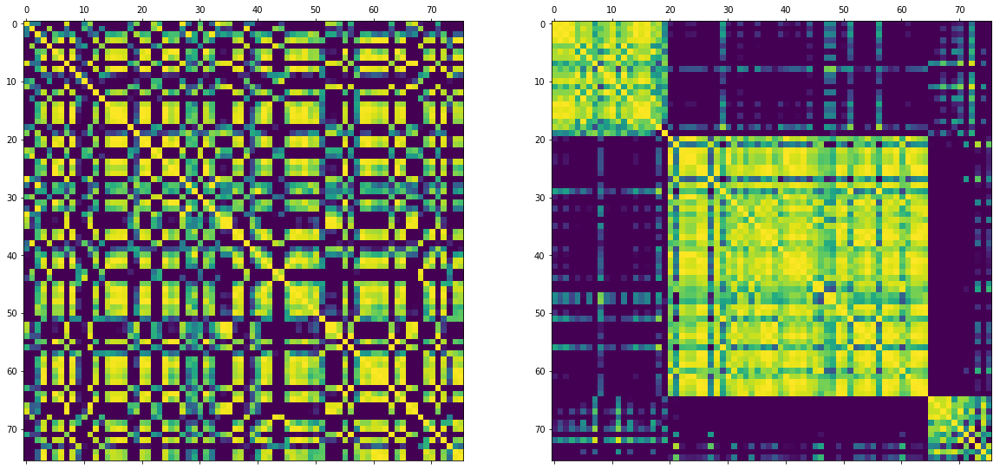

In [710]:
draw_AP_dist_mat(corr_genes_IRS1, cl_g_PT_IRS1, cmap = plt.cm.viridis, vmin = 0.0, vmax = 1.0)

### Checkpoint

In [711]:
saveData_v1(cl_g_PT_IRS1, path_output, exp_id, 'cl_g_PT_IRS1')

## IRS2

In [712]:
pt_thr = 0.01
fc_thr = 1
fc_thr_null = 1
max_expr = 0.25

In [713]:
genes_sel_IRS2 = ANA_stats_IRS2.loc[genes_sel,'Pr(>Chisq)-BH_null'][ANA_stats_IRS2.loc[genes_sel,'Pr(>Chisq)-BH_null']<pt_thr].index
genes_sel_IRS2 = fc_dpt_ANA_IRS2.loc[genes_sel_IRS2][fc_dpt_ANA_IRS1.loc[genes_sel_IRS2]>fc_thr].index
genes_sel_IRS2 = fc_dpt_ANA_IRS2_vs_null.loc[genes_sel_IRS2][fc_dpt_ANA_IRS2_vs_null.loc[genes_sel_IRS2]>fc_thr].index
genes_sel_IRS2 = ANA_fitted_IRS2_max.loc[genes_sel_IRS2][ANA_fitted_IRS2_max.loc[genes_sel_IRS2]>max_expr].index

In [714]:
len(genes_sel_IRS2)

80

In [715]:
corr_genes_IRS2 = ANA_fitted_IRS2.loc[genes_sel_IRS2].astype(float).T.corr()

In [769]:
cl_g_PT_IRS2 =  AP_clustering_v4P(corr_genes_IRS2, 0, -2, 0.6)

In [770]:
len(set(cl_g_PT_IRS2))

3

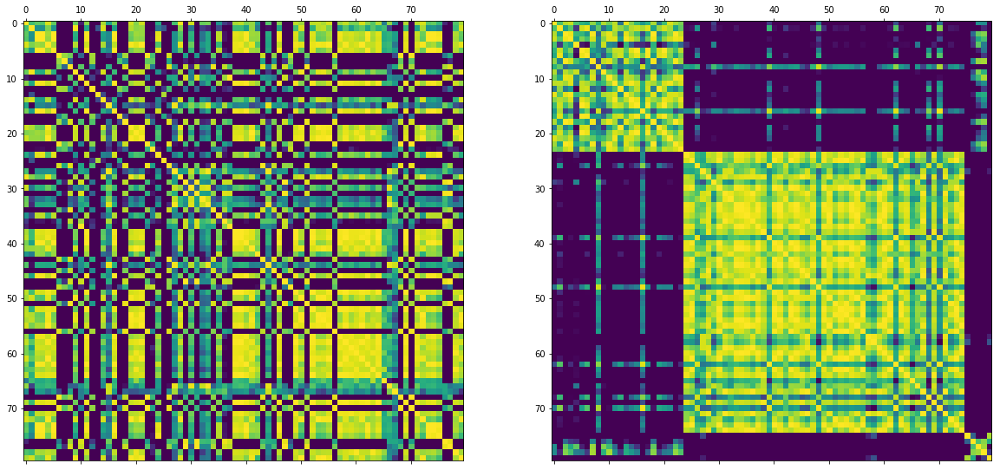

In [771]:
draw_AP_dist_mat(corr_genes_IRS2, cl_g_PT_IRS2, cmap = plt.cm.viridis, vmin = 0.0, vmax = 1.0)

### Checkpoint

In [753]:
saveData_v1(cl_g_PT_IRS2, path_output, exp_id, 'cl_g_PT_IRS2')

# Compare anagen data to Yang et al. dataset based of MNN batch correction

## Import data

In [80]:
cl_c_2nd = loadData_v1(path_output, exp_id, 'cl_c_2nd', 'Series')
cl_c_ANA = cl_c_2nd[[ix for ix in cl_c_2nd.index if cl_c_2nd[ix].split()[0] == 'ANA']]

In [81]:
seq_Joost = loadData_v1(path_output, exp_id, 'seq', 'DataFrame')
seq_Joost = seq_Joost[cl_c_ANA.index]

In [131]:
len(seq_Joost.columns)

1974

In [82]:
seq_Yang = loadData_v1(path_input, 'GSE90848', 'Ana6_basal_hair_bulb_TPM', 'DataFrame')

In [83]:
Yang_meta = pd.read_csv('%s/P30_Anagen_basal_matrix_filtered_metadata.csv' % path_input, index_col = 0)

In [119]:
path = '%s/%s_cmap_2nd.pkl' % (path_output, exp_id)
f = open(path, 'rb')
cmap_2nd = pickle.load(f)

In [84]:
ERCC_sel = [g for g in seq_Yang.index if 'ERCC' in g]
seq_Yang = seq_Yang.drop(ERCC_sel)
seq_Yang.index = [g.split('_')[1] for g in seq_Yang.index]

In [85]:
seq_Yang = fuse_genes_v1(seq_Yang)

In [86]:
seq_Yang = seq_Yang[Yang_meta.index]

In [87]:
len(seq_Yang.columns)

367

In [88]:
g_sel = list(set(seq_Joost.index) & set(seq_Yang.index))

In [89]:
len(g_sel)

26633

In [90]:
seq_Joost = seq_Joost.loc[g_sel]
seq_Yang = seq_Yang.loc[g_sel]

## Downsample Yang data to a equivalent depth with the main data

In [91]:
sc_Yang = to_scanpy(seq_Yang)

Transforming to str index.
Transforming to str index.


In [92]:
sc.pp.downsample_counts(sc_Yang, 
                        counts_per_cell = np.random.choice(seq_Joost.sum(), size = len(seq_Yang.columns)).astype(int))

In [93]:
seq_Yang_ds = pd.DataFrame(sc_Yang.X.T, index = sc_Yang.var['Gene'].values, columns = sc_Yang.obs['CellID'].values)

In [95]:
seq_comb = pd.concat([seq_Joost, seq_Yang_ds], axis = 1)

In [96]:
cells_batch = pd.Series('0', index = list(seq_Joost.columns) + list(seq_Yang.columns))
cells_batch[seq_Yang.columns] = '1'

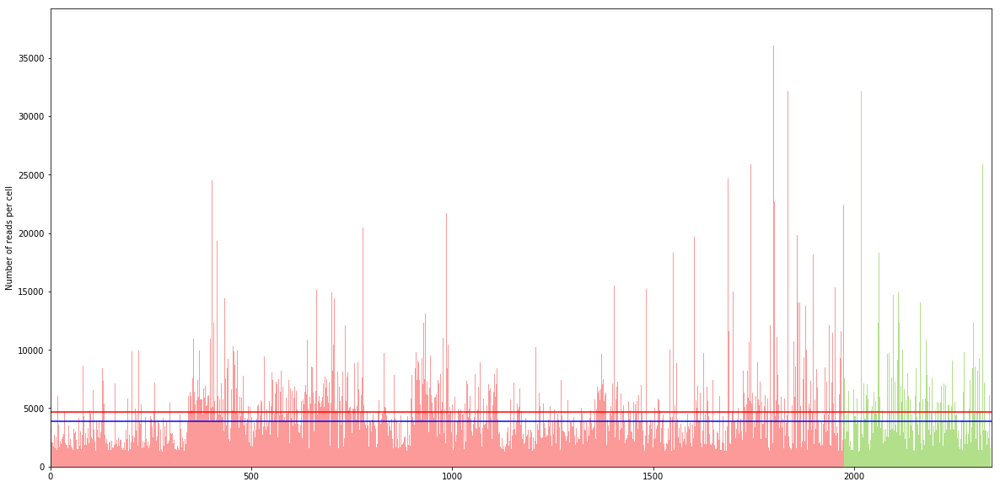

In [97]:
draw_barplots_QC(seq_comb,'reads',cells_batch,{'0':'#fb9a99','1':'#b2df8a'})

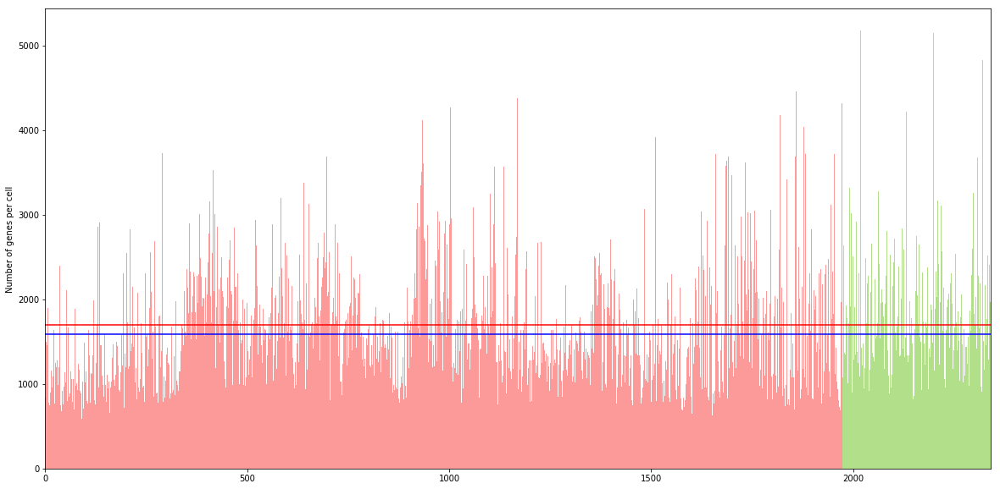

In [98]:
draw_barplots_QC(seq_comb,'genes',cells_batch,{'0':'#fb9a99','1':'#b2df8a'})

In [99]:
seq_Joost_N = seq_comb[seq_Joost.columns]
seq_Yang_N = seq_comb[seq_Yang.columns]

In [100]:
g_sel_ANA = loadData_v1(path_output, exp_id, 'seq_sel_ANA', 'DataFrame').index

In [102]:
g_sel_ANA = [g for g in g_sel_ANA if g in seq_comb.index]

In [103]:
len(g_sel_ANA)

2485

In [104]:
seq_comb_N_sel = seq_comb.loc[g_sel_ANA]
seq_Joost_N_sel = seq_Joost_N.loc[g_sel_ANA]
seq_Yang_N_sel = seq_Yang_N.loc[g_sel_ANA]

### Train classifier

In [105]:
umap_ANA = loadData_v1(path_output, exp_id, 'umap_ANA', 'DataFrame')

In [106]:
from sklearn.linear_model import LogisticRegressionCV

In [107]:
from numpy import zeros, arange, sqrt, random, r_, newaxis, any, arctan, pi, argsort, in1d, array
from scipy.spatial.distance import cdist

In [108]:
df_ref_log = np.log2(seq_Joost_N+1)[cl_c_ANA.index]
df_test_log = np.log2(seq_Yang_N+1)

In [109]:
ddd = {i[1]:i[0] for i in enumerate(return_unique(cl_c_ANA))}

In [110]:
tsnedf = umap_ANA
tsnedf = tsnedf.loc[df_ref_log.columns,:]
tcs = tsnedf.values

In [111]:
df_ref_cent = df_ref_log.subtract(df_ref_log.mean(1), 'rows')#.divide( df_log.std(1), 'rows')
df_test_cent = df_test_log.subtract(df_test_log.mean(1), 'rows')#.divide( df_lgr5_log.std(1), 'rows')

In [112]:
cefcelltypes = cl_c_ANA.values.flat[:]
Counter( cefcelltypes )

Counter({'ANA - 1': 51,
         'ANA - 21': 36,
         'ANA - 0': 28,
         'ANA - 2': 101,
         'ANA - 3': 102,
         'ANA - 20': 17,
         'ANA - 16': 129,
         'ANA - 13': 139,
         'ANA - 15': 180,
         'ANA - 12': 113,
         'ANA - 17': 106,
         'ANA - 5': 182,
         'ANA - 4': 71,
         'ANA - 14': 96,
         'ANA - 6': 66,
         'ANA - 7': 123,
         'ANA - 10': 77,
         'ANA - 11': 39,
         'ANA - 18': 171,
         'ANA - 8': 147})

In [113]:
classes_names, classes_index = np.unique(cefcelltypes, return_inverse=True, return_counts=False)

In [114]:
train_index = classes_index

In [115]:
LR = LogisticRegressionCV(Cs=30, 
                          fit_intercept=True, 
                          cv=10, dual=False, 
                          penalty='l1',
                          scoring=None, 
                          solver='liblinear', 
                          tol=0.0001, 
                          max_iter=1000, 
                          class_weight=None, 
                          n_jobs=1, verbose=0, 
                          refit=True, 
                          intercept_scaling=1.0, 
                          multi_class='ovr',
                          random_state=None)

In [116]:
LR.fit(df_ref_log.T, cefcelltypes)

LogisticRegressionCV(Cs=30, class_weight=None, cv=10, dual=False,
           fit_intercept=True, intercept_scaling=1.0, max_iter=1000,
           multi_class='ovr', n_jobs=1, penalty='l1', random_state=None,
           refit=True, scoring=None, solver='liblinear', tol=0.0001,
           verbose=0)

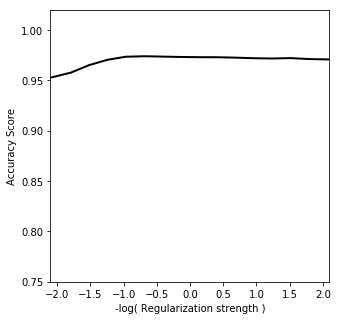

In [117]:
plt.figure(figsize=(5,5))
ax = plt.subplot(111)

ax.set_ylabel('Accuracy Score')
ax.set_xlabel('-log( Regularization strength )')
ax.set_xlim(-2.1,2.1)
ax.set_ylim(0.75,1.02)

ax.plot(np.log10(LR.Cs_), np.mean([LR.scores_[i].mean(0) for i in return_unique(cl_c_ANA)],0), c='k', lw=2 )

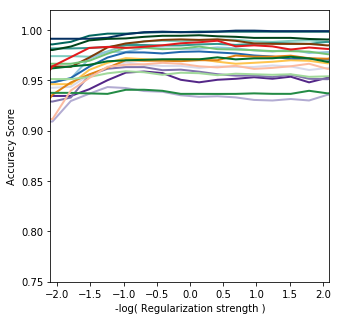

In [120]:
plt.figure(figsize=(5,5))
ax = plt.subplot(111)

ax.set_ylabel('Accuracy Score')
ax.set_xlabel('-log( Regularization strength )')
ax.set_xlim(-2.1,2.1)
ax.set_ylim(0.75,1.02)

for i in return_unique(cl_c_ANA):

    ax.plot(np.log10(LR.Cs_), LR.scores_[i].mean(0), lw=2, c = cmap_2nd[i])

In [121]:
probs = LR.predict_proba(df_test_log.values.T)
thrs_p = 0.4
bool1 = np.sum( probs > thrs_p,1) >0
rank_clusters = argsort(argsort( probs ,1),1)
bool_top3 = (rank_clusters >= len(classes_names)-2) & (probs > 0.2)

In [122]:
nn = []
for i in range(df_test_log.shape[1]):
    if bool1[i]:
        selected_dev = in1d(array(cefcelltypes), classes_names[bool_top3[i,:]])
        distances = cdist(df_test_cent.ix[:,i:i+1].T, df_ref_cent.ix[:,selected_dev].T, metric='correlation')
        top_n = argsort( distances[0,:] )[:5]
        xi = arange(df_ref_log.shape[1])[selected_dev][top_n]
        ws = probs[i,train_index[xi]][:,newaxis]
        nn.append( (tcs[xi,:]*ws).sum(0)/sum(ws) )
    else:
        nn.append([np.NAN,np.NAN])
        
nn = array(nn)

/Users/simjoo/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:5: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated
  """
/Users/simjoo/.local/lib/python3.6/site-packages/pandas/core/indexing.py:890: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated
  retval = getattr(retval, self.name)._getitem_axis(key, axis=i)


In [123]:
tsne_nn = pd.DataFrame(nn, columns = ['x','y'], index = df_test_log.columns)

In [124]:
len(tsne_nn.index)

367

In [125]:
tsne_nn = tsne_nn[~np.any(np.isnan(tsne_nn), 1)]

In [126]:
len(tsne_nn.index)

307

/Users/simjoo/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:42: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated
/Users/simjoo/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:43: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated
/Users/simjoo/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:52: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated
/Users/simjoo/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:53: DeprecationWar

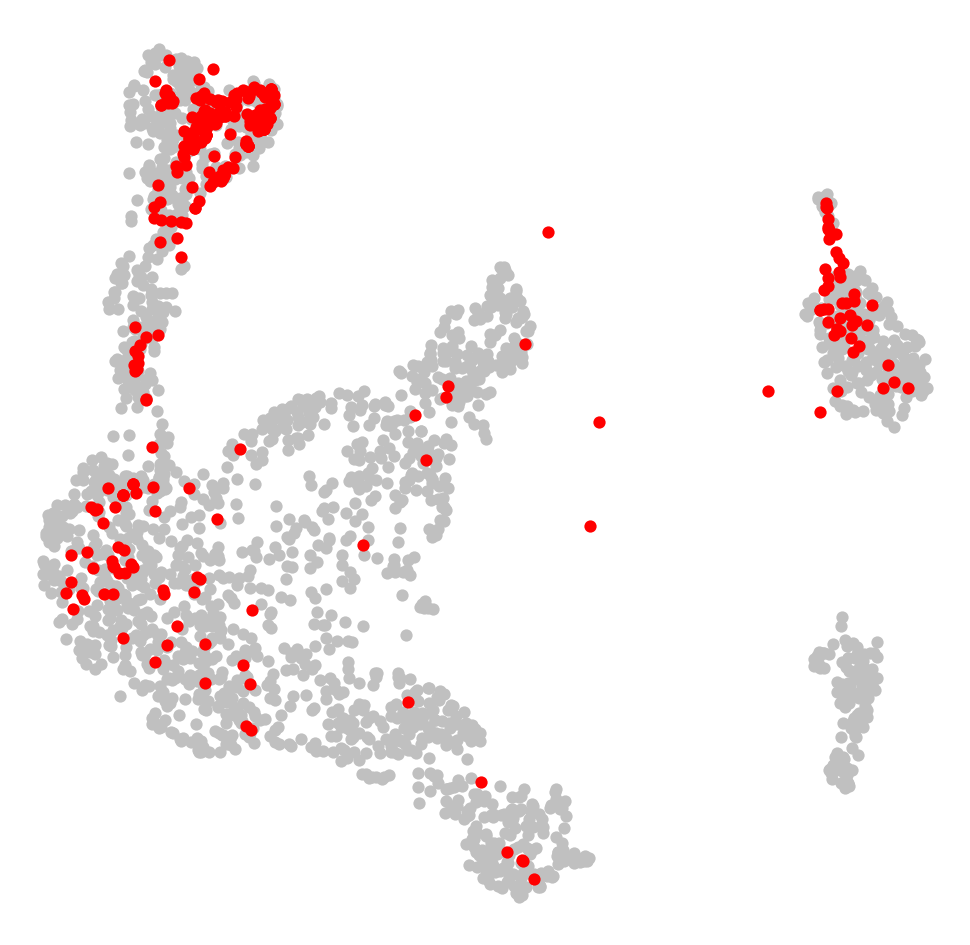

In [127]:
tsne1 = umap_ANA
tsne2 = tsne_nn
cells = cl_c_ANA
cmap = cmap_2nd

#initialize figure

height = 17
width = 17

fig = plt.figure(facecolor = 'w', figsize = (width, height))

#define x- and y-limits

x_min, x_max = np.min(tsne1['x']), np.max(tsne1['x'])
y_min, y_max = np.min(tsne1['y']), np.max(tsne1['y'])
x_diff, y_diff = x_max - x_min, y_max - y_min

pad = 2.0

if x_diff > y_diff:
    xlim = (x_min - pad, x_max + pad)
    ylim = (y_min * (x_diff / y_diff) - pad, y_max * (x_diff / y_diff) + pad)

if x_diff < y_diff:
    xlim = (x_min * (y_diff/x_diff) - pad, x_max * (y_diff/x_diff) + pad)
    ylim = (y_min - pad, y_max + pad)

text_pad = 2
    
#draw groups

ax1 = plt.subplot()

ax1.set_xlim(xlim[0], xlim[1])
ax1.set_ylim(ylim[0], ylim[1])

remove_ticks(ax1)

for ix in tsne1.index:

    ax1.scatter(tsne1.ix[ix,'x'],
                tsne1.ix[ix,'y'], 
                s = 150,
                linewidth = 0.0,
                c = 'silver',
                edgecolor='black', 
                marker = 'o')
    
for ix in tsne2.index:

    ax1.scatter(tsne2.ix[ix,'x'],
                tsne2.ix[ix,'y'], 
                s = 150,
                linewidth = 0.0,
                c = 'red',
                edgecolor='black', 
                marker = 'o')

clean_axis(ax1)

### Checkpoint

In [129]:
saveData_v1(tsne_nn, path_output, exp_id, 'tsne_nn_ds')

# Potential receptor-ligand interactions

## Identify receptors and ligands upregulated 2nd level populations

In [13]:
seqN = loadData_v1(path_output, exp_id, 'seqN', 'DataFrame')

In [14]:
cl_c_2nd = loadData_v1(path_output, exp_id, 'cl_c_2nd', 'Series')

In [15]:
cl_c_2nd_sel = cl_c_2nd[cl_c_2nd!='JUNK']

### Get ligands and receptors with mean expression > 0.25 in at least one groups

In [16]:
def get_mean_per_group(data, groups, genes):
    
    output = pd.DataFrame(index = genes, columns = return_unique(groups))
    
    for gr in return_unique(groups):
        c_sel = groups[groups==gr].index
        output[gr] = data.loc[genes, c_sel].mean(axis=1)
        
    return output

In [17]:
PairsLigRec_mm = loadData_v1(path_input, exp_id, 'PairsLigRec_mm', 'DataFrame')

In [18]:
ligands = list(set(PairsLigRec_mm['Ligand.ApprovedSymbol_mm'].values))
ligands = [g for g in ligands if g in seqN.index]

In [19]:
len(ligands)

725

In [20]:
receptors = list(set(PairsLigRec_mm['Receptor.ApprovedSymbol_mm'].values))
receptors = [g for g in receptors if g in seqN.index]

In [21]:
len(receptors)

676

In [22]:
seq_mean_lig_rec = get_mean_per_group(seqN, cl_c_2nd_sel, list(set(ligands + receptors)))

In [23]:
ligands = [g for g in ligands if seq_mean_lig_rec.loc[g].max() > 0.25]

In [24]:
len(ligands)

323

In [25]:
receptors = [g for g in receptors if seq_mean_lig_rec.loc[g].max() > 0.25]

In [26]:
len(receptors)

319

### Get ligands and receptors upregulated against global average

In [27]:
seqN_log2 = np.log2(seqN + 1)

In [27]:
MWU_av_2nd_lig = MWU_vs_average(seqN_log2, cl_c_2nd_sel, ligands, dview)

/Users/simjoo/Projects/10X_Skin/scripts/Skin10X_mann_whitney_u_v1_3.py:82: RuntimeWarning: divide by zero encountered in log10
  output = -np.log10(output.astype(float))


In [28]:
MWU_av_2nd_rec = MWU_vs_average(seqN_log2, cl_c_2nd_sel, receptors, dview)

/Users/simjoo/Projects/10X_Skin/scripts/Skin10X_mann_whitney_u_v1_3.py:82: RuntimeWarning: divide by zero encountered in log10
  output = -np.log10(output.astype(float))


### Checkpoint

In [29]:
#saveData_v1(MWU_av_2nd_lig, path_output, exp_id, 'MWU_av_2nd_lig')
#saveData_v1(MWU_av_2nd_rec, path_output, exp_id, 'MWU_av_2nd_rec')

## Receptors and ligands in GL1(Id3hi) and GL4(Lef1hi)

In [32]:
MWU_av_2nd_lig = MWU_vs_average(seqN_log2, cl_c_2nd_sel[cl_c_2nd_sel.isin(['ANA - 12','ANA - 16'])], ligands, dview)

In [33]:
MWU_av_2nd_rec = MWU_vs_average(seqN_log2, cl_c_2nd_sel[cl_c_2nd_sel.isin(['ANA - 12','ANA - 16'])], receptors, dview)

In [41]:
#saveData_v1(MWU_av_2nd_lig, path_output, exp_id, 'MWU_av_2nd_GL_lig')
#saveData_v1(MWU_av_2nd_rec, path_output, exp_id, 'MWU_av_2nd_GL_rec')